# Network clock evaluation on three external cohorts

Test the best network clock against reference clocks (Horvath 2013, Hannum) on three EPIC datasets:

| Dataset | N | Disease groups | Tissue |
|---|---|---|---|
| GSE235717 | 35 | aging study (no cases/controls) | WB |
| GSE217633 | 88 | Control (44) / HIV (44) | WB |
| GSE200376 | 64 | Control (19) / psoriasis_arthritis (25) / psoriasis_vulgaris (20) | **PBMC** |

**Note:** GSE200376 is PBMC, not whole blood. The network clock was trained on WB. Expect somewhat degraded performance on this cohort.

**Two figures (style matches `plot_from_data.ipynb`):**

1. **Scatter** — chronological vs predicted age, colored by disease group, shaped by dataset
2. **Box plots** — per-sample absolute error, three panels (network / Horvath / Hannum), boxes grouped by (dataset, disease group)

In [6]:
import warnings, time, re, pickle
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.metrics import r2_score, mean_absolute_error
import pyaging as pya
from collections import Counter

warnings.filterwarnings("ignore")

# ── Saved clocks from 05_network_clock.ipynb (OLS) ──
SAVED_CLOCKS_DIR = Path("../outputs/05_clock/saved_clocks")
TRAIN_MODE = "random"
RAND_NET_CLOCKS_PKL   = SAVED_CLOCKS_DIR / f"best_clocks_random_network_{TRAIN_MODE}.pkl"
RAND_CLUST_CLOCKS_PKL = SAVED_CLOCKS_DIR / f"best_clocks_random_per_cluster_{TRAIN_MODE}.pkl"

# ── Saved clocks from 05_network_clock_v2.ipynb (Ridge variant) ──
RIDGE_CLOCKS_DIR        = Path("../outputs/05_clock_ridge/saved_clocks")
RIDGE_RAND_NET_PKL      = RIDGE_CLOCKS_DIR / f"best_clocks_random_network_{TRAIN_MODE}.pkl"
RIDGE_RAND_CLUST_PKL    = RIDGE_CLOCKS_DIR / f"best_clocks_random_per_cluster_{TRAIN_MODE}.pkl"

# ── Saved clocks from 05_pca_clock.ipynb ──
PCA_CLOCK_PKL         = Path("../outputs/05_pca_clock/saved_clocks/pca_clock.pkl")          # cluster-level PCA
PCA_NETWORK_CLOCK_PKL = Path("../outputs/05_pca_clock/saved_clocks/pca_network_clock.pkl")  # whole-network PCA baseline
PCA_ARRAY_CLOCK_PKL   = Path("../outputs/05_pca_clock/saved_clocks/pca_array_clock.pkl")    # whole-array PCA baseline

# ── Training data (used only by the optional Cell 5 below) ──
BETAS_TRAIN   = "../outputs/01_filtered_betas/BetaMatrix_0.35.tsv"
AGES_TRAIN    = "../outputs/01_filtered_betas/Samplesheet.csv"
MODULE_CSV    = "../outputs/02_network/module_assignments_0.70.csv"
TOP_M_MODULES = 500

# ── External cohorts ──
EXTERNAL_DATASETS = [
    {"id": "GSE235717", "betas": "data/EPIC/GSE235717/beta_normalized1.tsv",
        "sheet": "data/EPIC/GSE235717/samplesheet1.csv", "marker": "o"},
    {"id": "GSE217633", "betas": "data/EPIC/GSE217633/beta_normalized2.tsv",
        "sheet": "data/EPIC/GSE217633/samplesheet2.csv", "marker": "s"},
    {"id": "GSE200376", "betas": "data/EPIC/GSE200376/beta_normalized3.tsv",
        "sheet": "data/EPIC/GSE200376/samplesheet3.csv", "marker": "^"},
]

REFERENCE_CLOCKS = ["horvath2013", "hannum", "altumage", "skinandblood", "han"]
CLOCK_LABELS = {
    "horvath2013": "Horvath", "hannum": "Hannum", "altumage": "AltumAge",
    "skinandblood": "Skin & Blood", "han": "Han",
}

OUT_DIR = Path("outputs/test_network_clock_3cohorts")
OUT_DIR.mkdir(parents=True, exist_ok=True)

# ── Style ──
DPI = 300; FRAME_LW = 2.0
mpl.rcParams.update({
    "font.family": ["Helvetica", "Arial", "DejaVu Sans"],
    "font.size": 16, "axes.labelsize": 16, "axes.titlesize": 16,
    "xtick.labelsize": 16, "ytick.labelsize": 16,
    "legend.fontsize": 14, "legend.frameon": False,
    "axes.edgecolor": "black", "axes.linewidth": FRAME_LW,
    "axes.spines.top": True, "axes.spines.right": True,
    "xtick.direction": "in", "ytick.direction": "in",
    "xtick.major.size": 6, "ytick.major.size": 6,
    "xtick.major.width": 1.2, "ytick.major.width": 1.2,
    "figure.dpi": DPI, "savefig.dpi": DPI, "savefig.bbox": "tight",
    "figure.facecolor": "white", "axes.facecolor": "white",
})

GROUP_COLORS = {
    "Control":             "#4477AA",
    "HIV":                 "#EE6677",
    "psoriasis_vulgaris":  "#CCBB44",
    "psoriasis_arthritis": "#AA3377",
    "Aging study":         "#888888",
    "unknown":             "#BBBBBB",
}
METHOD_COLOR = {
    "top_modules":              "#332288",
    "random_network":           "#888888",
    "random_per_cluster":       "#DDCC77",
    # Ridge variants — same hue family, different shade
    "random_network_ridge":     "#4477AA",
    "random_per_cluster_ridge": "#EE9933",
    # PCA clocks
    "pca":                      "#117733",
    "pca_network":              "#882255",
    "pca_array":                "#EE7733",
}
METHOD_LABEL = {
    "top_modules":              "Network clock (top modules)",
    "random_network":           "Random CpGs from network",
    "random_per_cluster":       "Random 1 per cluster",
    "random_network_ridge":     "Random CpGs from network (Ridge)",
    "random_per_cluster_ridge": "Random 1 per cluster (Ridge)",
    "pca":                      "PCA clock (clusters)",
    "pca_network":              "PCA clock (whole network)",
    "pca_array":                "PCA clock (whole array)",
}
REF_COLOR_MAP = {"horvath2013": "#999933", "hannum": "#CC6677",
                 "altumage":    "#117733", "skinandblood": "#882255",
                 "han":         "#88CCEE"}

def _to_gsm(s):
    m = re.match(r"(GSM\d+)", str(s).strip())
    return m.group(1) if m else str(s)

## Load saved network clocks


In [7]:
def load_clocks(path, label):
    if not path.exists():
        raise FileNotFoundError(
            f"\n  ⚠ Saved clocks not found at: {path}\n"
            f"  → Run 05_network_clock.ipynb first to generate the {label} clocks."
        )
    with open(path, "rb") as f:
        clocks = pickle.load(f)
    print(f"  {label}: {len(clocks)} clocks (M = {sorted(clocks.keys())})")
    return clocks

print("Loading saved clocks ...")
#top_clocks        = load_clocks(TOP_CLOCKS_PKL,        "top-modules")
rand_net_clocks   = load_clocks(RAND_NET_CLOCKS_PKL,   "random-network")
rand_clust_clocks = load_clocks(RAND_CLUST_CLOCKS_PKL, "random-per-cluster")

def pick_best(clocks):
    return max(clocks.items(), key=lambda kv: kv[1]["r2_test"])

#best_top_M,       best_top_clock       = pick_best(top_clocks)
best_randnet_M,   best_randnet_clock   = pick_best(rand_net_clocks)
best_randclust_M, best_randclust_clock = pick_best(rand_clust_clocks)

print()
#print(f"  Best top-modules        : M={best_top_M},       training-test R²={best_top_clock['r2_test']:.3f}")
print(f"  Best random-network     : M={best_randnet_M},   training-test R²={best_randnet_clock['r2_test']:.3f}")
print(f"  Best random-per-cluster : M={best_randclust_M}, training-test R²={best_randclust_clock['r2_test']:.3f}")

# ── Ridge clocks ──────────────────────────────────────────────
print("\nLoading saved Ridge clocks ...")
ridge_rand_net   = load_clocks(RIDGE_RAND_NET_PKL,   "random-network (Ridge)")
ridge_rand_clust = load_clocks(RIDGE_RAND_CLUST_PKL, "random-per-cluster (Ridge)")

best_ridge_net_M,   best_ridge_net_clock   = pick_best(ridge_rand_net)
best_ridge_clust_M, best_ridge_clust_clock = pick_best(ridge_rand_clust)
print()
print(f"  Best Ridge random-network     : M={best_ridge_net_M},   training-test R²={best_ridge_net_clock['r2_test']:.3f}")
print(f"  Best Ridge random-per-cluster : M={best_ridge_clust_M}, training-test R²={best_ridge_clust_clock['r2_test']:.3f}")

# ── PCA clock ────────────────────────────────────────────────
print("\nLoading saved PCA clock ...")
if not PCA_CLOCK_PKL.exists():
    raise FileNotFoundError(f"\n  ⚠ PCA clock not found at: {PCA_CLOCK_PKL}\n"
                            f"  → Run 05_pca_clock.ipynb first to generate it.")
with open(PCA_CLOCK_PKL, "rb") as f:
    pca_clock = pickle.load(f)

print(f"  PCA clock: K sweep = {sorted(pca_clock['clock_by_K'].keys())}")
print(f"  Best K (train/test): {pca_clock['best_K']}  "
      f"training-test R²={pca_clock['clock_by_K'][pca_clock['best_K']]['r2_test']:.3f}")


# ── Network-baseline PCA clock (PCA on the whole CpG set, no cluster collapse) ──
print("\nLoading saved network-baseline PCA clock ...")
if not PCA_NETWORK_CLOCK_PKL.exists():
    raise FileNotFoundError(
        f"\n  ⚠ Network PCA clock not found at: {PCA_NETWORK_CLOCK_PKL}\n"
        f"  → Run 05_pca_clock.ipynb (section 7b) to generate it.")
with open(PCA_NETWORK_CLOCK_PKL, "rb") as f:
    pca_network_clock = pickle.load(f)

print(f"  Network PCA clock: K sweep = {sorted(pca_network_clock['clock_by_K'].keys())}")
print(f"  Best K (train/test): {pca_network_clock['best_K']}  "
      f"training-test R²={pca_network_clock['clock_by_K'][pca_network_clock['best_K']]['r2_test']:.3f}")
print(f"  Uses {len(pca_network_clock['cpg_order']):,} CpGs (no cluster collapse)")


# ── Whole-array PCA clock (PCA on every probe in Beta_ALL.tsv) ──
print("\nLoading saved whole-array PCA clock ...")
if not PCA_ARRAY_CLOCK_PKL.exists():
    raise FileNotFoundError(
        f"\n  ⚠ Whole-array PCA clock not found at: {PCA_ARRAY_CLOCK_PKL}\n"
        f"  → Run 05_pca_clock_v2.ipynb (section 7c) to generate it.")
with open(PCA_ARRAY_CLOCK_PKL, "rb") as f:
    pca_array_clock = pickle.load(f)

print(f"  Whole-array PCA clock: K sweep = {sorted(pca_array_clock['clock_by_K'].keys())}")
print(f"  Best K (train/test): {pca_array_clock['best_K']}  "
      f"training-test R²={pca_array_clock['clock_by_K'][pca_array_clock['best_K']]['r2_test']:.3f}")
print(f"  Uses {len(pca_array_clock['cpg_order']):,} CpGs (whole unfiltered array)")


Loading saved clocks ...
  random-network: 14 clocks (M = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500])
  random-per-cluster: 14 clocks (M = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500])

  Best random-network     : M=200,   training-test R²=0.770
  Best random-per-cluster : M=200, training-test R²=0.776

Loading saved Ridge clocks ...
  random-network (Ridge): 14 clocks (M = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500])
  random-per-cluster (Ridge): 14 clocks (M = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500])

  Best Ridge random-network     : M=400,   training-test R²=0.806
  Best Ridge random-per-cluster : M=500, training-test R²=0.804

Loading saved PCA clock ...
  PCA clock: K sweep = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
  Best K (train/test): 60  training-test R²=0.840

Loading saved network-baseline PCA clock ...
  Network PCA clock: K sweep = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
  Best K (train/test):

## Load training cohort + module assignments

(This part is identical to the previous notebook — load training betas, ages, module assignments.)

In [8]:
print("Loading training betas ...")
df_train = pd.read_csv(BETAS_TRAIN, sep="\t", index_col=0, low_memory=False)
if pd.Series(df_train.index.astype(str)).head(20).str.startswith("cg").sum() > 10:
    df_train = df_train.T
df_train = df_train.apply(pd.to_numeric, errors="coerce")
df_train = df_train.fillna(df_train.mean(numeric_only=True))

ages_train_ss = pd.read_csv(AGES_TRAIN)
age_col = next((c for c in ["Age", "age", "AGE"] if c in ages_train_ss.columns), None)
id_col  = next((c for c in ["Sample_ID", "sample_id", "GSM"] if c in ages_train_ss.columns), None)
age_map = dict(zip(ages_train_ss[id_col].astype(str), ages_train_ss[age_col].astype(float)))
ages_train = np.array([age_map.get(s, np.nan) for s in df_train.index.astype(str)])
mask = ~np.isnan(ages_train)
df_train = df_train.loc[mask]
ages_train = ages_train[mask]
print(f"  {df_train.shape[0]} training samples × {df_train.shape[1]:,} CpGs")
print(f"  Age range: {ages_train.min():.0f}–{ages_train.max():.0f}")

df_mod = pd.read_csv(MODULE_CSV)
module_dict = dict(zip(df_mod["CpG"].astype(str), df_mod["Module"].astype(int)))
mc = Counter(module_dict.values())
top_modules = [m for m, _ in mc.most_common(TOP_M_MODULES)]
module_to_cpgs = {m: [] for m in top_modules}
for cpg, m in module_dict.items():
    if m in module_to_cpgs:
        module_to_cpgs[m].append(cpg)
print(f"\nTop {len(top_modules)} modules")
print(f"  Sizes range: {min(mc[m] for m in top_modules)}–{max(mc[m] for m in top_modules)} CpGs")

Loading training betas ...
  1917 training samples × 7,328 CpGs
  Age range: 18–94

Top 500 modules
  Sizes range: 1–2252 CpGs


## Load all three external cohorts and concatenate

In [9]:
import time
from pathlib import Path
import pyarrow.csv as pacsv

CACHE_DIR = Path("../outputs/_betas_cache")
CACHE_DIR.mkdir(parents=True, exist_ok=True)

def load_external(path_betas, path_sheet, dataset_id):
    """Load one external cohort. No NaN fill, no dtype gymnastics — just load.
    First call parses the TSV with pyarrow.csv and caches as parquet; subsequent
    calls read the parquet (seconds, not minutes)."""
    print(f"\n— Loading {dataset_id} —")
    t0 = time.time()

    cache_path = CACHE_DIR / f"{dataset_id}.parquet"

    if cache_path.exists():
        df = pd.read_parquet(cache_path)
        print(f"  cache hit: {df.shape} in {time.time()-t0:.1f}s")
    else:
        print(f"  cache miss — parsing TSV with pyarrow.csv ...")
        table = pacsv.read_csv(
            str(path_betas),
            parse_options=pacsv.ParseOptions(delimiter="\t"),
        )
        print(f"    parsed in {time.time()-t0:.1f}s — {table.num_rows:,} rows × {table.num_columns} cols")

        t1 = time.time()
        df = table.to_pandas()
        del table
        df = df.set_index(df.columns[0])
        print(f"    to_pandas in {time.time()-t1:.1f}s")

        # Orient: samples must be rows, CpGs must be columns
        if pd.Series(df.index.astype(str)).head(20).str.startswith("cg").sum() > 10:
            t2 = time.time()
            df = df.T
            print(f"    transposed to {df.shape} in {time.time()-t2:.1f}s")

        df.index = [_to_gsm(s) for s in df.index]

        # Persist for next time
        t3 = time.time()
        df.to_parquet(cache_path)
        print(f"    cached → {cache_path} in {time.time()-t3:.1f}s")

    # ── Samplesheet (unchanged) ──────────────────────────────────
    sheet = pd.read_csv(path_sheet)
    id_col  = next((c for c in ["Sample_ID", "Sample_Name", "GSM"] if c in sheet.columns),
                   sheet.columns[0])
    age_col = next((c for c in ["Age", "age", "AGE"] if c in sheet.columns), None)
    grp_col = next((c for c in ["Disease", "disease", "group", "Group", "status"]
                    if c in sheet.columns), None)
    sheet[id_col] = sheet[id_col].astype(str).apply(_to_gsm)
    ages_map = dict(zip(sheet[id_col], sheet[age_col].astype(float)))
    if grp_col is None:
        group_map = {gsm: "Aging study" for gsm in sheet[id_col]}
    else:
        group_map = dict(zip(sheet[id_col], sheet[grp_col].astype(str)))
        group_map = {k: ("Aging study" if (v is None or v == "" or str(v).lower() == "nan") else v)
                     for k, v in group_map.items()}

    ages = np.array([ages_map.get(s, np.nan) for s in df.index])
    grps = np.array([group_map.get(s, "unknown") for s in df.index])
    keep = ~np.isnan(ages) & (grps != "unknown")
    df   = df.loc[keep]
    print(f"  {df.shape[0]} samples × {df.shape[1]:,} CpGs | total {time.time()-t0:.1f}s")
    return df, ages[keep], grps[keep], df.index.tolist()


ext_data = []
for d in EXTERNAL_DATASETS:
    df_e, ages_e, grps_e, ids_e = load_external(d["betas"], d["sheet"], d["id"])
    ext_data.append({"id": d["id"], "marker": d["marker"], "betas": df_e,
                     "ages": ages_e, "groups": grps_e, "gsm_ids": ids_e})
print(f"\nTotal external samples: {sum(len(d['ages']) for d in ext_data)}")


— Loading GSE235717 —
  cache miss — parsing TSV with pyarrow.csv ...
    parsed in 0.4s — 745,905 rows × 36 cols
    to_pandas in 0.2s
    transposed to (35, 745905) in 0.0s
    cached → ../outputs/_betas_cache/GSE235717.parquet in 67.9s
  35 samples × 745,905 CpGs | total 68.9s

— Loading GSE217633 —
  cache miss — parsing TSV with pyarrow.csv ...
    parsed in 0.9s — 744,568 rows × 89 cols
    to_pandas in 0.4s
    transposed to (88, 744568) in 0.0s
    cached → ../outputs/_betas_cache/GSE217633.parquet in 69.0s
  88 samples × 744,568 CpGs | total 70.8s

— Loading GSE200376 —
  cache miss — parsing TSV with pyarrow.csv ...
    parsed in 0.6s — 742,819 rows × 65 cols
    to_pandas in 0.3s
    transposed to (64, 742819) in 0.0s
    cached → ../outputs/_betas_cache/GSE200376.parquet in 69.7s
  64 samples × 742,819 CpGs | total 71.1s

Total external samples: 187


In [ ]:
"""import shutil
from pathlib import Path
shutil.rmtree(Path("../outputs/_betas_cache"), ignore_errors=True)
print("cleared")"""

SyntaxError: incomplete input (2435809317.py, line 4)

## Reference clocks via pyaging — predict on all three cohorts

In [11]:
ref_predictions = {}
for d in ext_data:
    print(f"\n— pyaging on {d['id']} —")
    df_e = d["betas"].copy()
    row_medians = df_e.median(axis=1)
    df_e = df_e.apply(lambda col: col.fillna(row_medians))
    adata = pya.preprocess.df_to_adata(df_e, imputer_strategy="mean", verbose=False)
    pya.pred.predict_age(adata, REFERENCE_CLOCKS, verbose=False)
    ref_predictions[d["id"]] = {}
    for cn in REFERENCE_CLOCKS:
        if cn in adata.obs.columns:
            pred = adata.obs[cn].values.astype(float)
            ref_predictions[d["id"]][cn] = pred
            r2 = r2_score(d["ages"], pred)
            mae = mean_absolute_error(d["ages"], pred)
            print(f"  {CLOCK_LABELS[cn]:14s}: R²={r2:.3f}, MAE={mae:.2f}y")
        else:
            ref_predictions[d["id"]][cn] = np.full(len(d["ages"]), np.nan)

ref_pooled = {}
for cn in REFERENCE_CLOCKS:
    ages_all = np.concatenate([d["ages"] for d in ext_data])
    pred_all = np.concatenate([ref_predictions[d["id"]][cn] for d in ext_data])
    mask = ~np.isnan(pred_all)
    ref_pooled[cn] = {
        "r2":  r2_score(ages_all[mask], pred_all[mask]),
        "mae": mean_absolute_error(ages_all[mask], pred_all[mask]),
    }

ref_per_dataset = {d["id"]: {} for d in ext_data}
for d in ext_data:
    for cn in REFERENCE_CLOCKS:
        pred = ref_predictions[d["id"]][cn]
        mask = ~np.isnan(pred)
        if mask.sum() >= 3:
            ref_per_dataset[d["id"]][cn] = {
                "r2":  r2_score(d["ages"][mask], pred[mask]),
                "mae": mean_absolute_error(d["ages"][mask], pred[mask]),
            }


— pyaging on GSE235717 —
  Horvath       : R²=0.762, MAE=8.08y
  Hannum        : R²=0.670, MAE=9.57y
  AltumAge      : R²=0.743, MAE=8.46y
  Skin & Blood  : R²=0.956, MAE=3.18y
  Han           : R²=0.859, MAE=5.04y

— pyaging on GSE217633 —
  Horvath       : R²=-0.131, MAE=10.33y
  Hannum        : R²=0.249, MAE=8.48y
  AltumAge      : R²=-0.018, MAE=9.48y
  Skin & Blood  : R²=0.690, MAE=4.73y
  Han           : R²=0.432, MAE=6.39y

— pyaging on GSE200376 —
  Horvath       : R²=0.218, MAE=8.95y
  Hannum        : R²=0.375, MAE=8.04y
  AltumAge      : R²=-0.617, MAE=12.85y
  Skin & Blood  : R²=0.762, MAE=4.71y
  Han           : R²=0.208, MAE=8.98y


## Network-clock predictor (load-and-apply)

Given a saved clock dict, apply it to an external beta matrix. The clock stores `cpgs`, `coefs`, `intercept`, plus the `scaler_mean` and `scaler_scale` from training. If a CpG is missing in the external cohort, we impute with the per-sample median across the external matrix.

In [12]:
def apply_network_clock(clock, df_ext):
    """Apply a saved network clock to external betas. Returns (predictions, n_missing_cpgs)."""
    cpgs   = list(clock["cpgs"])
    coefs  = np.asarray(clock["coefs"], dtype=float)
    intercept = float(clock["intercept"])
    sc_mean   = np.asarray(clock["scaler_mean"],  dtype=float)
    sc_scale  = np.asarray(clock["scaler_scale"], dtype=float)

    median_per_sample = df_ext.median(axis=1)
    X = np.zeros((df_ext.shape[0], len(cpgs)))
    n_missing = 0
    for j, cg in enumerate(cpgs):
        if cg in df_ext.columns:
            col = df_ext[cg].values
            mask_nan = pd.isna(col)
            if mask_nan.any():
                col = col.copy()
                col[mask_nan] = median_per_sample.values[mask_nan]
        else:
            col = median_per_sample.values
            n_missing += 1
        X[:, j] = col

    X_s = (X - sc_mean) / np.where(sc_scale > 0, sc_scale, 1.0)
    pred = X_s @ coefs + intercept
    return pred, n_missing



# ── PCA clock predictor ──────────────────────────────────────────
def apply_pca_clock(subclock, df_ext):
    """Apply a saved PCA sub-clock dict to external betas.

    A PCA "sub-clock" is the per-K bundle we build below from pca_clock:
    it carries the cluster definitions, scaler params, PCA loadings, and the
    K-specific PC regression weights — everything needed to predict from raw
    CpG-level betas in one call. Returns (predictions, n_missing_cpgs).
    """
    cluster_order = subclock["cluster_order"]
    defs          = subclock["cluster_definitions"]
    pc_coefs      = np.asarray(subclock["pc_coefs"], dtype=float)
    intercept     = float(subclock["intercept"])
    K             = int(subclock["K"])

    median_per_sample = df_ext.median(axis=1)

    # 1) Build cluster matrix in the SAME column order as training
    cols = {}
    missing_cpgs = 0
    for cid in cluster_order:
        cpgs  = defs[cid]["cpgs"]
        strat = defs[cid]["strategy"]
        present = [c for c in cpgs if c in df_ext.columns]
        missing_cpgs += (len(cpgs) - len(present))
        if not present:
            cols[cid] = pd.Series(np.nan, index=df_ext.index)
            continue
        if strat == "singleton":
            col = df_ext[present[0]].copy()
        elif strat == "median":
            col = df_ext[present].median(axis=1)
        else:  # "mean" — kept for backward compatibility with older clocks
            col = df_ext[present].mean(axis=1)
        # Per-sample median fallback for any NaN in this cluster column
        nan_mask = col.isna()
        if nan_mask.any():
            col[nan_mask] = median_per_sample[nan_mask]
        cols[cid] = col
    X_new = pd.DataFrame(cols)[cluster_order]

    # 2) Fill any entirely-missing cluster columns with training mean
    mean  = subclock["scaler_mean"]
    scale = subclock["scaler_scale"]
    for j, cid in enumerate(cluster_order):
        if X_new[cid].isna().any():
            X_new[cid] = X_new[cid].fillna(mean[j])

    # 3) Standardise with training params
    X_new_s = (X_new.values - mean) / np.where(scale > 0, scale, 1.0)

    # 4) Project to PC space, take top-K
    V        = subclock["pca_components"]
    pca_mean = subclock["pca_mean"]
    Z        = (X_new_s - pca_mean) @ V.T
    return Z[:, :K] @ pc_coefs + intercept, missing_cpgs


def build_pca_subclocks(full_clock):
    """Unpack the full PCA clock dict into one self-contained sub-clock per K.
    Each sub-clock can be passed to apply_pca_clock(subclock, df_ext) directly,
    so it slots into the same iteration pattern as the OLS/Ridge clocks dicts.
    """
    sub = {}
    for K, k_entry in full_clock["clock_by_K"].items():
        sub[K] = {
            "cluster_definitions": full_clock["cluster_definitions"],
            "cluster_order":       full_clock["cluster_order"],
            "scaler_mean":         full_clock["scaler_mean"],
            "scaler_scale":        full_clock["scaler_scale"],
            "pca_components":      full_clock["pca_components"],
            "pca_mean":            full_clock["pca_mean"],
            "pc_coefs":            k_entry["pc_coefs"],
            "intercept":           k_entry["intercept"],
            "K":                   K,
            "r2_test":             k_entry["r2_test"],
            "mae_test":            k_entry["mae_test"],
        }
    return sub

pca_subclocks = build_pca_subclocks(pca_clock)
print(f"  Built {len(pca_subclocks)} PCA sub-clocks: K = {sorted(pca_subclocks.keys())}")


# ── Network-baseline PCA clock predictor ─────────────────────────
def apply_pca_network_clock(subclock, df_ext):
    """Apply a saved network-baseline PCA sub-clock to external betas.

    No cluster aggregation step — the feature vector is the saved cpg_order
    columns of df_ext, with missing CpGs filled by the training mean.
    Returns (predictions, n_missing_cpgs).
    """
    cpg_order = subclock["cpg_order"]
    pc_coefs  = np.asarray(subclock["pc_coefs"], dtype=float)
    intercept = float(subclock["intercept"])
    K         = int(subclock["K"])

    mean  = subclock["scaler_mean"]
    scale = subclock["scaler_scale"]

    # Pull CpG columns in the SAME order as training; missing CpGs → training mean
    present_mask = np.array([c in df_ext.columns for c in cpg_order])
    n_missing = int((~present_mask).sum())

    X_new = np.empty((df_ext.shape[0], len(cpg_order)), dtype=float)
    present_cpgs = [c for c, p in zip(cpg_order, present_mask) if p]
    if present_cpgs:
        X_new[:, present_mask] = df_ext[present_cpgs].values
    if n_missing:
        X_new[:, ~present_mask] = mean[~present_mask]

    # NaN within a present CpG → per-sample median fallback, then training mean as last resort
    if np.isnan(X_new).any():
        median_per_sample = df_ext.median(axis=1).values
        for j in np.where(np.isnan(X_new).any(axis=0))[0]:
            col = X_new[:, j]
            nan_mask = np.isnan(col)
            col[nan_mask] = median_per_sample[nan_mask]
            still_nan = np.isnan(col)
            if still_nan.any():
                col[still_nan] = mean[j]
            X_new[:, j] = col

    X_new_s = (X_new - mean) / np.where(scale > 0, scale, 1.0)
    V        = subclock["pca_components"]
    pca_mean = subclock["pca_mean"]
    Z        = (X_new_s - pca_mean) @ V.T
    return Z[:, :K] @ pc_coefs + intercept, n_missing


def build_pca_network_subclocks(full_clock):
    """One self-contained sub-clock per K from a network_clock full dict."""
    sub = {}
    for K, k_entry in full_clock["clock_by_K"].items():
        sub[K] = {
            "cpg_order":      full_clock["cpg_order"],
            "scaler_mean":    full_clock["scaler_mean"],
            "scaler_scale":   full_clock["scaler_scale"],
            "pca_components": full_clock["pca_components"],
            "pca_mean":       full_clock["pca_mean"],
            "pc_coefs":       k_entry["pc_coefs"],
            "intercept":      k_entry["intercept"],
            "K":              K,
            "r2_test":        k_entry["r2_test"],
            "mae_test":       k_entry["mae_test"],
        }
    return sub

pca_net_subclocks = build_pca_network_subclocks(pca_network_clock)
print(f"  Built {len(pca_net_subclocks)} network-PCA sub-clocks: K = {sorted(pca_net_subclocks.keys())}")


# Whole-array PCA uses the same cpg_order structure → reuse the generic builder/predictor
pca_arr_subclocks = build_pca_network_subclocks(pca_array_clock)
print(f"  Built {len(pca_arr_subclocks)} whole-array PCA sub-clocks: K = {sorted(pca_arr_subclocks.keys())}")


  Built 10 PCA sub-clocks: K = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
  Built 10 network-PCA sub-clocks: K = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]


## Predict on every external cohort with every saved clock

In [13]:
method_to_dict = {
  #  "top_modules":        top_clocks,
    "random_network":     rand_net_clocks,
    "random_per_cluster": rand_clust_clocks,
}

ext_perf_rows = []
for method_name, clocks in method_to_dict.items():
    for M, clock in clocks.items():
        ages_pool, pred_pool = [], []
        for d in ext_data:
            pred, n_miss = apply_network_clock(clock, d["betas"])
            ages_pool.append(d["ages"]); pred_pool.append(pred)
            r2_d  = r2_score(d["ages"], pred) if len(d["ages"]) >= 3 else np.nan
            mae_d = mean_absolute_error(d["ages"], pred)
            ext_perf_rows.append({
                "method": method_name, "M": M, "scope": d["id"],
                "n_samples": len(d["ages"]), "n_cpgs_missing": n_miss,
                "r2": r2_d, "mae": mae_d,
            })
        ages_all = np.concatenate(ages_pool)
        pred_all = np.concatenate(pred_pool)
        ext_perf_rows.append({
            "method": method_name, "M": M, "scope": "pooled",
            "n_samples": len(ages_all), "n_cpgs_missing": None,
            "r2":  r2_score(ages_all, pred_all),
            "mae": mean_absolute_error(ages_all, pred_all),
        })

df_perf = pd.DataFrame(ext_perf_rows)
df_perf.to_csv(OUT_DIR / "network_clock_perf_by_M.csv", index=False)
print(df_perf.head(20).to_string(index=False))

        method  M     scope  n_samples  n_cpgs_missing         r2        mae
random_network 10 GSE235717         35             1.0   0.752488   7.414902
random_network 10 GSE217633         88             1.0  -0.042214   9.715064
random_network 10 GSE200376         64             1.0   0.274229   8.628078
random_network 10    pooled        187             NaN   0.397688   8.912536
random_network 20 GSE235717         35             3.0 -18.742022  80.497205
random_network 20 GSE217633         88             3.0 -62.665482  86.545447
random_network 20 GSE200376         64             3.0 -51.535942  83.583652
random_network 20    pooled        187             NaN -39.535060  84.399761
random_network 30 GSE235717         35             0.0   0.817124   6.330976
random_network 30 GSE217633         88             1.0  -2.005916  17.698400
random_network 30 GSE200376         64             0.0   0.678814   5.462288
random_network 30    pooled        187             NaN  -0.092655  11.383047

## Figure 1 — R² vs n_modules (pooled across all 3 cohorts)

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/r2_vs_M_pooled.png


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.


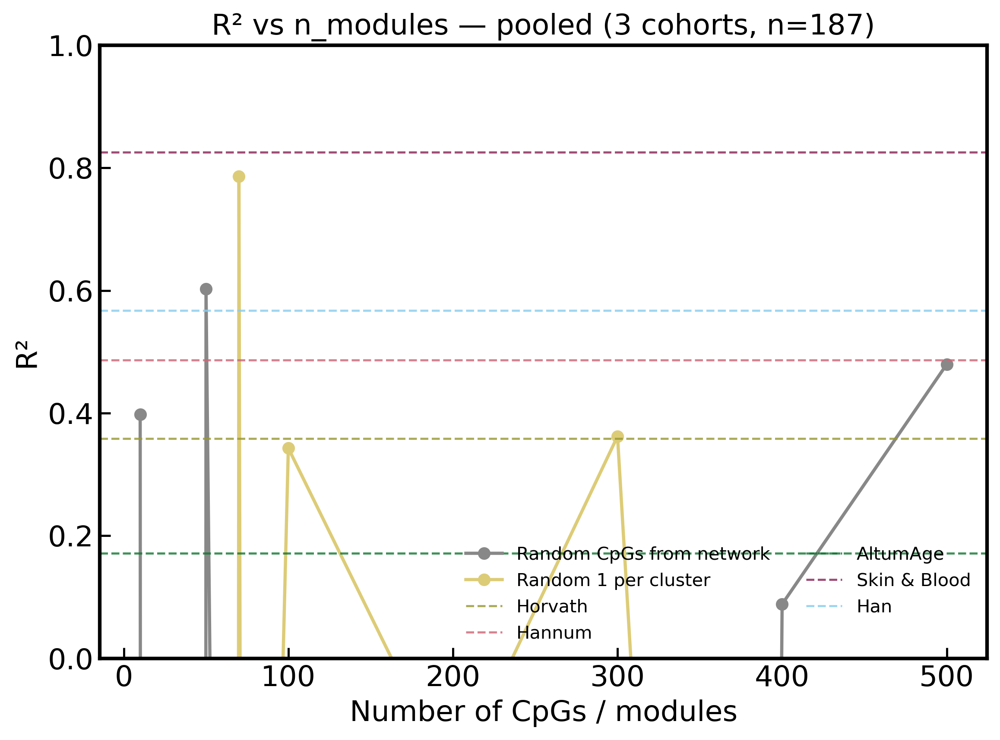

In [14]:
def plot_r2_vs_M(ax, df_scope, ref_metrics, title=""):
    """Plot R² vs M for random_network and random_per_cluster only — top_modules is hidden.
    Reference clocks appear as horizontal dashed lines."""
    methods_to_show = ("random_network", "random_per_cluster")
    for method, dsub in df_scope.groupby("method"):
        if method not in methods_to_show:
            continue
        dsub = dsub.sort_values("M")
        ax.plot(dsub["M"], dsub["r2"], "o-",
                color=METHOD_COLOR[method], lw=1.8, markersize=6,
                label=METHOD_LABEL[method])
    for cn, r in ref_metrics.items():
        if "r2" not in r: continue
        ax.axhline(r["r2"], ls="--", lw=1.2, alpha=0.8,
                    color=REF_COLOR_MAP.get(cn, "#666"),
                    label=CLOCK_LABELS[cn])
    ax.set_xlabel("Number of CpGs / modules")
    ax.set_ylabel("R²")
    ax.set_ylim(0,1)
    if title: ax.set_title(title)
    ax.tick_params(direction="in", which="both")
    for s in ax.spines.values(): s.set_linewidth(FRAME_LW)

df_pooled = df_perf[df_perf["scope"] == "pooled"]
fig, ax = plt.subplots(figsize=(8, 6))
plot_r2_vs_M(ax, df_pooled, ref_pooled,
              title="R² vs n_modules — pooled (3 cohorts, n=187)")
ax.legend(loc="lower right", fontsize=10, frameon=False, ncol=2)
fig.tight_layout()
fig.savefig(OUT_DIR / "r2_vs_M_pooled.png", dpi=DPI)
fig.savefig(OUT_DIR / "r2_vs_M_pooled.pdf")
print(f"  -> {OUT_DIR / 'r2_vs_M_pooled.png'}")
plt.show()


## Figure 2 — R² vs n_modules, 3 panels (one per cohort)

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/r2_vs_M_three_panels.png


findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Fon

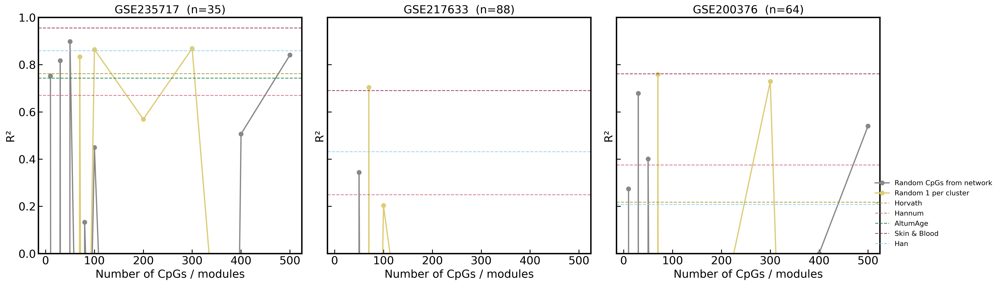

In [15]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)
for ax, d in zip(axes, ext_data):
    df_d = df_perf[df_perf["scope"] == d["id"]]
    plot_r2_vs_M(ax, df_d, ref_per_dataset.get(d["id"], {}),
                  title=f"{d['id']}  (n={len(d['ages'])})")
axes[-1].legend(loc="lower right", fontsize=10, frameon=False, ncol=1,
                  bbox_to_anchor=(1.45, 0.0))
fig.tight_layout()
fig.savefig(OUT_DIR / "r2_vs_M_three_panels.png", dpi=DPI)
fig.savefig(OUT_DIR / "r2_vs_M_three_panels.pdf")
print(f"  -> {OUT_DIR / 'r2_vs_M_three_panels.png'}")
plt.show()


## Figure 3 — Scatter for the best Random-from-network clock


── Best clocks by EXTERNAL pooled R² ──
  Random-from-network     : M=50  (train/test selection had picked M=200)
  Random-one-per-cluster  : M=70  (train/test selection had picked M=200)


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/scatter_random_network_ext_best.png
  -> outputs/test_network_clock_3cohorts/scatter_random_network_ext_best.csv


findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Fon

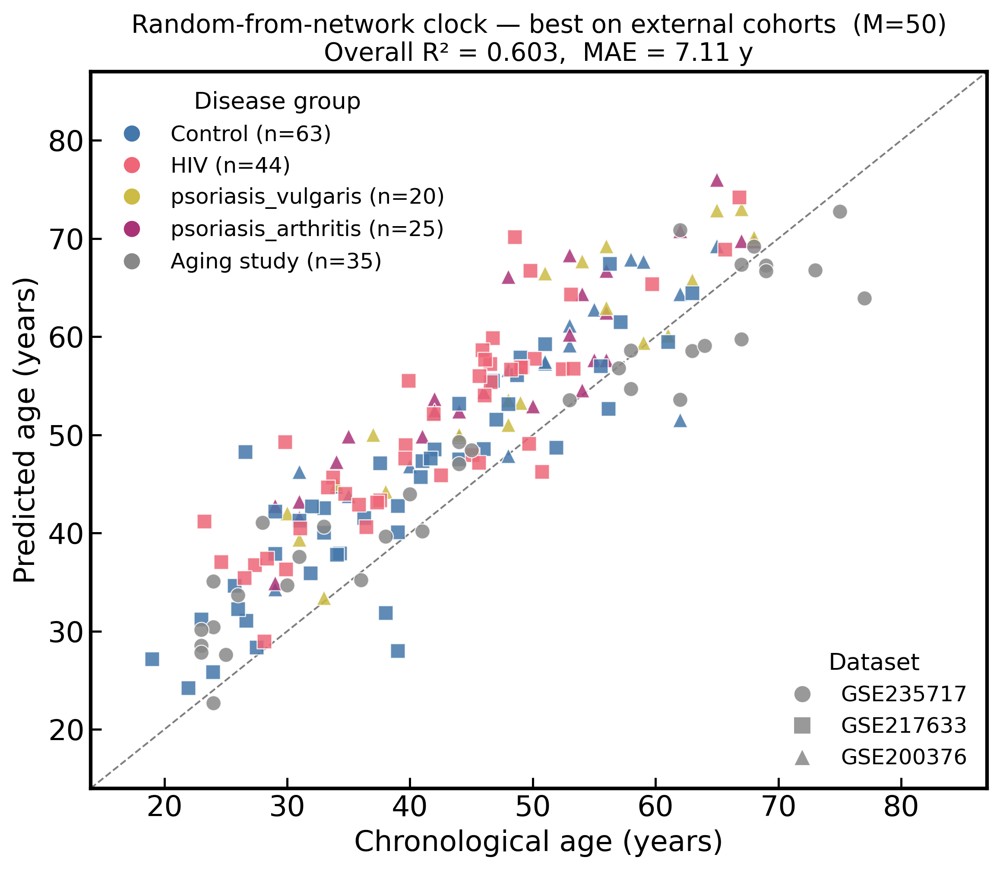

In [16]:
def make_scatter(clock, label_str, save_basename, apply_fn=None):
    if apply_fn is None:
        apply_fn = apply_network_clock
    preds_per = []
    for d in ext_data:
        pred, _ = apply_fn(clock, d["betas"])
        for i, (gsm, age, grp) in enumerate(zip(d["gsm_ids"], d["ages"], d["groups"])):
            preds_per.append({"dataset": d["id"], "marker": d["marker"],
                              "gsm": gsm, "age": age, "group": grp,
                              "pred": pred[i]})
    df_p = pd.DataFrame(preds_per)

    fig, ax = plt.subplots(figsize=(8, 7))
    lims = [df_p["age"].min() - 5, df_p["age"].max() + 10]
    ax.plot(lims, lims, "k--", lw=1, alpha=0.5, zorder=0)

    shape_for = {d["id"]: d["marker"] for d in EXTERNAL_DATASETS}
    for (dset, grp), sub in df_p.groupby(["dataset", "group"]):
        color  = GROUP_COLORS.get(grp, GROUP_COLORS["unknown"])
        ax.scatter(sub["age"], sub["pred"], s=70, marker=shape_for[dset],
                    color=color, edgecolors="white", linewidth=0.6,
                    alpha=0.85, zorder=2)

    group_handles = []
    for g, c in GROUP_COLORS.items():
        if g in set(df_p["group"]):
            n = (df_p["group"] == g).sum()
            group_handles.append(Line2D([0], [0], marker="o", linestyle="",
                                          markerfacecolor=c, markeredgecolor="white",
                                          markersize=10, label=f"{g} (n={n})"))
    shape_handles = [
        Line2D([0], [0], marker=d["marker"], linestyle="",
                markerfacecolor="#999", markeredgecolor="white",
                markersize=10, label=d["id"])
        for d in EXTERNAL_DATASETS
    ]
    leg1 = ax.legend(handles=group_handles, loc="upper left", frameon=False,
                      fontsize=12, title="Disease group", title_fontsize=13)
    ax.add_artist(leg1)
    ax.legend(handles=shape_handles, loc="lower right", frameon=False,
              fontsize=12, title="Dataset", title_fontsize=13)

    ax.set_xlim(lims); ax.set_ylim(lims)
    ax.set_xlabel("Chronological age (years)")
    ax.set_ylabel("Predicted age (years)")
    overall_r2  = r2_score(df_p["age"], df_p["pred"])
    overall_mae = mean_absolute_error(df_p["age"], df_p["pred"])
    ax.set_title(f"{label_str}\n"
                  f"Overall R² = {overall_r2:.3f},  MAE = {overall_mae:.2f} y",
                  fontsize=14)
    ax.tick_params(direction="in", which="both")
    fig.tight_layout()
    df_p.to_csv(OUT_DIR / f"{save_basename}.csv", index=False)
    fig.savefig(OUT_DIR / f"{save_basename}.png", dpi=DPI)
    fig.savefig(OUT_DIR / f"{save_basename}.pdf")
    print(f"  -> {OUT_DIR / save_basename}.png")
    print(f"  -> {OUT_DIR / save_basename}.csv")
    plt.show()
    return df_p


# ── Pick the best clock by EXTERNAL pooled R² (not training-test R²) ──
# df_perf has rows for every (method, M, scope); we want scope == "pooled".
def _best_M_by_external_pooled(method_name, clocks_dict):
    pooled = df_perf[(df_perf["method"] == method_name) & (df_perf["scope"] == "pooled")]
    pooled = pooled[pooled["M"].isin(clocks_dict.keys())]
    if pooled.empty:
        # Fallback to training-test selection if pooled is empty for any reason
        return max(clocks_dict.items(), key=lambda kv: kv[1]["r2_test"])
    best_row = pooled.loc[pooled["r2"].idxmax()]
    best_M = int(best_row["M"])
    return best_M, clocks_dict[best_M]

ext_best_randnet_M,   ext_best_randnet_clock   = _best_M_by_external_pooled(
    "random_network",     rand_net_clocks)
ext_best_randclust_M, ext_best_randclust_clock = _best_M_by_external_pooled(
    "random_per_cluster", rand_clust_clocks)

print(f"\n── Best clocks by EXTERNAL pooled R² ──")
print(f"  Random-from-network     : M={ext_best_randnet_M}  "
      f"(train/test selection had picked M={best_randnet_M})")
print(f"  Random-one-per-cluster  : M={ext_best_randclust_M}  "
      f"(train/test selection had picked M={best_randclust_M})")

df_p_randnet = make_scatter(
    ext_best_randnet_clock,
    f"Random-from-network clock — best on external cohorts  (M={ext_best_randnet_M})",
    "scatter_random_network_ext_best",
)

## Figure 4 — Scatter for the best Random-one-per-cluster clock

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/scatter_random_per_cluster_ext_best.png
  -> outputs/test_network_clock_3cohorts/scatter_random_per_cluster_ext_best.csv


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

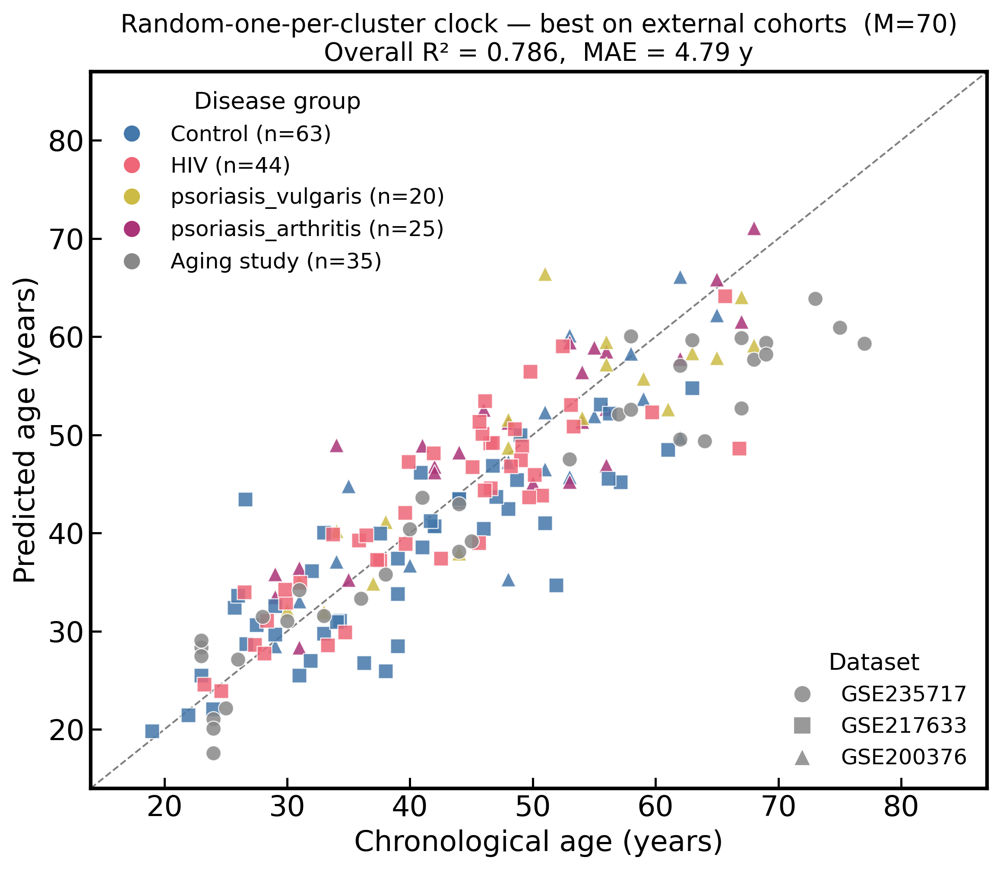

In [17]:
df_p_randclust = make_scatter(
    ext_best_randclust_clock,
    f"Random-one-per-cluster clock — best on external cohorts  (M={ext_best_randclust_M})",
    "scatter_random_per_cluster_ext_best",
)

## Figure 5 — MAE box plots, one panel per clock

6 panels: best top-modules network clock + 5 reference clocks. Per-sample |error|, grouped by (dataset, disease).

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

Wrote outputs/test_network_clock_3cohorts/per_sample_predictions_ext_best.csv (187 rows)


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/abs_error_boxplots_6panels_ext_best.png


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

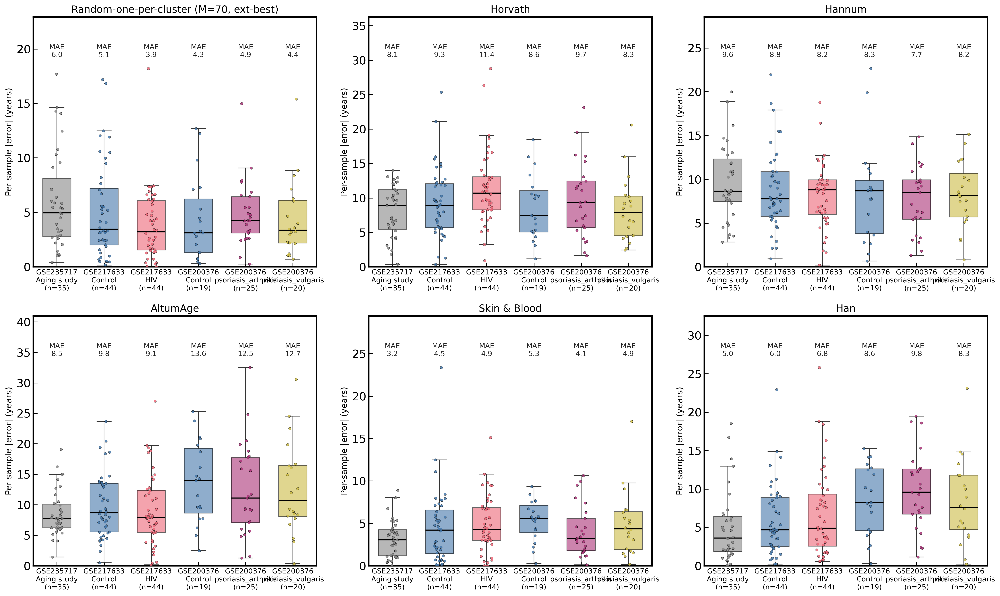

In [18]:
# Compute random-one-per-cluster predictions on each cohort using the
# externally-best clock (selected by pooled R² across the 3 cohorts).
clust_preds_per_dataset = {}
for d in ext_data:
    pred, _ = apply_network_clock(ext_best_randclust_clock, d["betas"])
    clust_preds_per_dataset[d["id"]] = pred

rows = []
for d in ext_data:
    for i, (gsm, age, grp) in enumerate(zip(d["gsm_ids"], d["ages"], d["groups"])):
        row = {"dataset": d["id"], "gsm": gsm, "age": age, "group": grp,
               "network": clust_preds_per_dataset[d["id"]][i]}
        for cn in REFERENCE_CLOCKS:
            row[cn] = ref_predictions[d["id"]][cn][i]
        rows.append(row)
df_pred = pd.DataFrame(rows)
for clock in ["network"] + REFERENCE_CLOCKS:
    df_pred[f"abs_err_{clock}"] = (df_pred[clock] - df_pred["age"]).abs()
df_pred.to_csv(OUT_DIR / "per_sample_predictions_ext_best.csv", index=False)
print(f"Wrote {OUT_DIR / 'per_sample_predictions_ext_best.csv'} ({len(df_pred)} rows)")

ordered_pairs = []
for d in EXTERNAL_DATASETS:
    sub = df_pred[df_pred["dataset"] == d["id"]]
    if len(sub) == 0: continue
    groups_in_d = sorted(sub["group"].unique(),
                          key=lambda g: (g not in ("Control", "Aging study"), g))
    for g in groups_in_d:
        ordered_pairs.append((d["id"], g))

# Panels: random-one-per-cluster (best on external) + 5 reference clocks
panels = [("network", f"Random-one-per-cluster (M={ext_best_randclust_M}, ext-best)")]
panels += [(cn, CLOCK_LABELS[cn]) for cn in REFERENCE_CLOCKS]

fig, axes = plt.subplots(2, 3, figsize=(20, 12), sharey=False)
axes_flat = axes.flatten()
for ax, (clock, title) in zip(axes_flat, panels):
    data_for_boxes, labels, colors, mae_per_box = [], [], [], []
    for (dset, grp) in ordered_pairs:
        sub = df_pred[(df_pred["dataset"] == dset) & (df_pred["group"] == grp)]
        vals = sub[f"abs_err_{clock}"].dropna().values
        if len(vals) == 0: continue
        data_for_boxes.append(vals)
        labels.append(f"{dset}\n{grp}\n(n={len(vals)})")
        colors.append(GROUP_COLORS.get(grp, GROUP_COLORS["unknown"]))
        mae_per_box.append(vals.mean())
    if not data_for_boxes:
        ax.set_title(f"{title} (no data)"); ax.axis("off"); continue
    positions = np.arange(len(data_for_boxes))
    bp = ax.boxplot(data_for_boxes, positions=positions, widths=0.6,
                     patch_artist=True, showfliers=False,
                     medianprops={"color": "black", "linewidth": 1.5},
                     whiskerprops={"color": "#333", "linewidth": 1.0},
                     capprops={"color": "#333", "linewidth": 1.0})
    for patch, c in zip(bp["boxes"], colors):
        patch.set_facecolor(c); patch.set_alpha(0.6); patch.set_edgecolor("black")
    rng_local = np.random.RandomState(0)
    for i, vals in enumerate(data_for_boxes):
        x = np.full(len(vals), i) + rng_local.uniform(-0.12, 0.12, len(vals))
        ax.scatter(x, vals, s=14, color=colors[i], edgecolor="black",
                    linewidth=0.3, alpha=0.85, zorder=3)
    y_top = max(max(v.max() for v in data_for_boxes), 5) * 1.05
    for i, mae in enumerate(mae_per_box):
        ax.text(i, y_top, f"MAE\n{mae:.1f}", ha="center", va="bottom",
                fontsize=10, color="#222")
    ax.set_xticks(positions)
    ax.set_xticklabels(labels, fontsize=10)
    ax.set_title(title, fontsize=14)
    ax.set_ylim(0,35)
    ax.set_ylabel("Per-sample |error| (years)", fontsize=12)
    ax.tick_params(direction="in", which="both")
    for s in ax.spines.values(): s.set_linewidth(FRAME_LW)
    ax.set_ylim(0, y_top * 1.2)
fig.tight_layout()
fig.savefig(OUT_DIR / "abs_error_boxplots_6panels_ext_best.png", dpi=DPI)
fig.savefig(OUT_DIR / "abs_error_boxplots_6panels_ext_best.pdf")
print(f"  -> {OUT_DIR / 'abs_error_boxplots_6panels_ext_best.png'}")
plt.show()

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.


Wrote outputs/test_network_clock_3cohorts/per_sample_predictions_ext_best.csv (187 rows)


findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Fon

  -> outputs/test_network_clock_3cohorts/abs_error_boxplots_6panels_ext_best.png


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

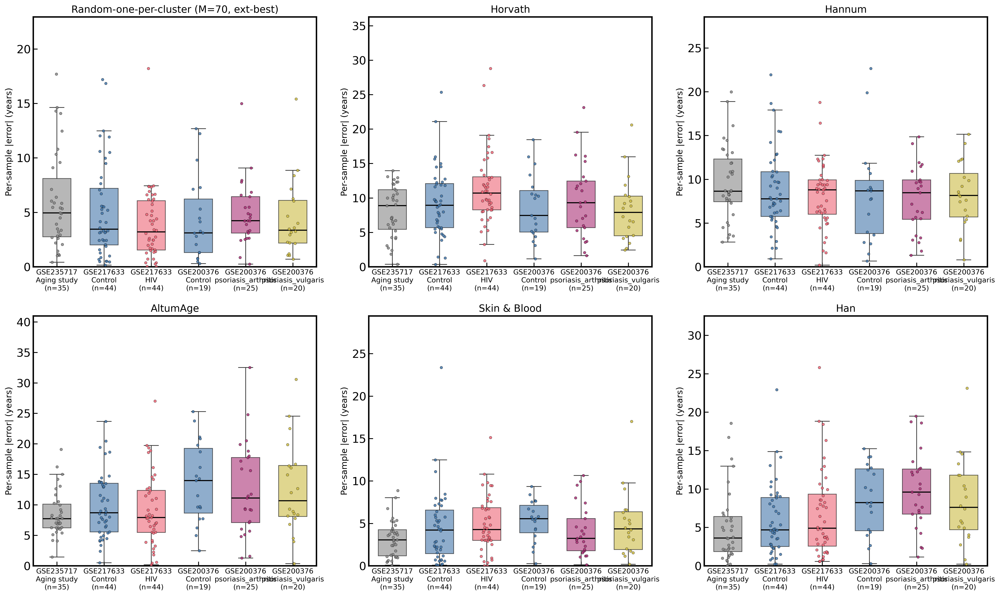

In [19]:
# Compute random-one-per-cluster predictions on each cohort using the
# externally-best clock (selected by pooled R² across the 3 cohorts).
clust_preds_per_dataset = {}
for d in ext_data:
    pred, _ = apply_network_clock(ext_best_randclust_clock, d["betas"])
    clust_preds_per_dataset[d["id"]] = pred

rows = []
for d in ext_data:
    for i, (gsm, age, grp) in enumerate(zip(d["gsm_ids"], d["ages"], d["groups"])):
        row = {"dataset": d["id"], "gsm": gsm, "age": age, "group": grp,
               "network": clust_preds_per_dataset[d["id"]][i]}
        for cn in REFERENCE_CLOCKS:
            row[cn] = ref_predictions[d["id"]][cn][i]
        rows.append(row)
df_pred = pd.DataFrame(rows)
for clock in ["network"] + REFERENCE_CLOCKS:
    df_pred[f"abs_err_{clock}"] = (df_pred[clock] - df_pred["age"]).abs()
df_pred.to_csv(OUT_DIR / "per_sample_predictions_ext_best.csv", index=False)
print(f"Wrote {OUT_DIR / 'per_sample_predictions_ext_best.csv'} ({len(df_pred)} rows)")

ordered_pairs = []
for d in EXTERNAL_DATASETS:
    sub = df_pred[df_pred["dataset"] == d["id"]]
    if len(sub) == 0: continue
    groups_in_d = sorted(sub["group"].unique(),
                          key=lambda g: (g not in ("Control", "Aging study"), g))
    for g in groups_in_d:
        ordered_pairs.append((d["id"], g))

# Panels: random-one-per-cluster (best on external) + 5 reference clocks
panels = [("network", f"Random-one-per-cluster (M={ext_best_randclust_M}, ext-best)")]
panels += [(cn, CLOCK_LABELS[cn]) for cn in REFERENCE_CLOCKS]

fig, axes = plt.subplots(2, 3, figsize=(20, 12), sharey=False)
axes_flat = axes.flatten()
for ax, (clock, title) in zip(axes_flat, panels):
    data_for_boxes, labels, colors, mae_per_box = [], [], [], []
    for (dset, grp) in ordered_pairs:
        sub = df_pred[(df_pred["dataset"] == dset) & (df_pred["group"] == grp)]
        vals = sub[f"abs_err_{clock}"].dropna().values
        if len(vals) == 0: continue
        data_for_boxes.append(vals)
        labels.append(f"{dset}\n{grp}\n(n={len(vals)})")
        colors.append(GROUP_COLORS.get(grp, GROUP_COLORS["unknown"]))
        mae_per_box.append(vals.mean())
    if not data_for_boxes:
        ax.set_title(f"{title} (no data)"); ax.axis("off"); ax.set_ylim(0,35); continue
    positions = np.arange(len(data_for_boxes))
    bp = ax.boxplot(data_for_boxes, positions=positions, widths=0.6,
                     patch_artist=True, showfliers=False,
                     medianprops={"color": "black", "linewidth": 1.5},
                     whiskerprops={"color": "#333", "linewidth": 1.0},
                     capprops={"color": "#333", "linewidth": 1.0})
    for patch, c in zip(bp["boxes"], colors):
        patch.set_facecolor(c); patch.set_alpha(0.6); patch.set_edgecolor("black")
    rng_local = np.random.RandomState(0)
    for i, vals in enumerate(data_for_boxes):
        x = np.full(len(vals), i) + rng_local.uniform(-0.12, 0.12, len(vals))
        ax.scatter(x, vals, s=14, color=colors[i], edgecolor="black",
                    linewidth=0.3, alpha=0.85, zorder=3)
    y_top = max(max(v.max() for v in data_for_boxes), 5) * 1.05
    ax.set_xticks(positions)
    ax.set_xticklabels(labels, fontsize=10)
    ax.set_title(title, fontsize=14)
    ax.set_ylim(0,35)
    ax.set_ylabel("Per-sample |error| (years)", fontsize=12)
    ax.tick_params(direction="in", which="both")
    for s in ax.spines.values(): s.set_linewidth(FRAME_LW)
    ax.set_ylim(0, y_top * 1.2)
fig.tight_layout()
fig.savefig(OUT_DIR / "abs_error_boxplots_6panels_ext_best.png", dpi=DPI)
fig.savefig(OUT_DIR / "abs_error_boxplots_6panels_ext_best.pdf")
print(f"  -> {OUT_DIR / 'abs_error_boxplots_6panels_ext_best.png'}")
plt.show()

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

Wrote outputs/test_network_clock_3cohorts/per_sample_predictions_ext_best.csv (187 rows)


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/abs_error_boxplot_per_clock_ext_best.png


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

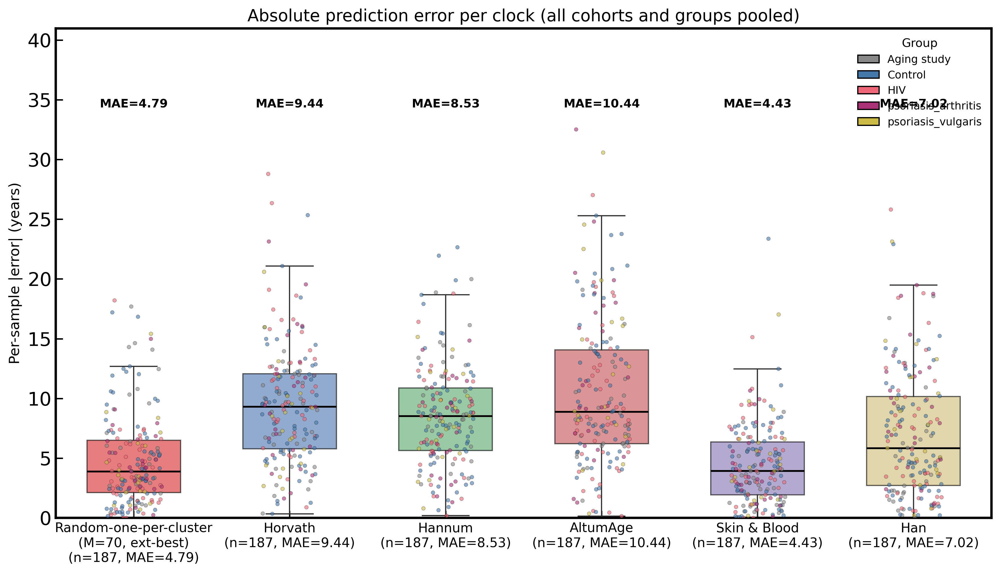

In [20]:
# Compute random-one-per-cluster predictions on each cohort using the
# externally-best clock (selected by pooled R² across the 3 cohorts).
clust_preds_per_dataset = {}
for d in ext_data:
    pred, _ = apply_network_clock(ext_best_randclust_clock, d["betas"])
    clust_preds_per_dataset[d["id"]] = pred

rows = []
for d in ext_data:
    for i, (gsm, age, grp) in enumerate(zip(d["gsm_ids"], d["ages"], d["groups"])):
        row = {"dataset": d["id"], "gsm": gsm, "age": age, "group": grp,
               "network": clust_preds_per_dataset[d["id"]][i]}
        for cn in REFERENCE_CLOCKS:
            row[cn] = ref_predictions[d["id"]][cn][i]
        rows.append(row)

df_pred = pd.DataFrame(rows)
for clock in ["network"] + REFERENCE_CLOCKS:
    df_pred[f"abs_err_{clock}"] = (df_pred[clock] - df_pred["age"]).abs()

df_pred.to_csv(OUT_DIR / "per_sample_predictions_ext_best.csv", index=False)
print(f"Wrote {OUT_DIR / 'per_sample_predictions_ext_best.csv'} ({len(df_pred)} rows)")

# One box per clock, pooling all samples across every dataset and group.
clocks = [("network", f"Random-one-per-cluster\n(M={ext_best_randclust_M}, ext-best)")]
clocks += [(cn, CLOCK_LABELS[cn]) for cn in REFERENCE_CLOCKS]

data_for_boxes, labels, mae_per_box = [], [], []
for clock, title in clocks:
    vals = df_pred[f"abs_err_{clock}"].dropna().values
    data_for_boxes.append(vals)
    labels.append(f"{title}\n(n={len(vals)}, MAE={vals.mean():.2f})")
    mae_per_box.append(vals.mean())

# Colour each clock distinctly; "network" highlighted.
clock_colors = ["#d62728"] + ["#4c72b0", "#55a868", "#c44e52",
                              "#8172b2", "#ccb974"][:len(REFERENCE_CLOCKS)]

fig, ax = plt.subplots(1, 1, figsize=(12, 7))

positions = np.arange(len(data_for_boxes))
bp = ax.boxplot(data_for_boxes, positions=positions, widths=0.6,
                patch_artist=True, showfliers=False,
                medianprops={"color": "black", "linewidth": 1.5},
                whiskerprops={"color": "#333", "linewidth": 1.0},
                capprops={"color": "#333", "linewidth": 1.0})
for patch, c in zip(bp["boxes"], clock_colors):
    patch.set_facecolor(c); patch.set_alpha(0.6); patch.set_edgecolor("black")

# Strip plot: colour each point by its group so subgroup structure stays visible.
rng_local = np.random.RandomState(0)
for i, (clock, _) in enumerate(clocks):
    sub = df_pred[[f"abs_err_{clock}", "group"]].dropna()
    vals = sub[f"abs_err_{clock}"].values
    point_colors = [GROUP_COLORS.get(g, GROUP_COLORS["unknown"]) for g in sub["group"]]
    x = np.full(len(vals), i) + rng_local.uniform(-0.18, 0.18, len(vals))
    ax.scatter(x, vals, s=10, c=point_colors, edgecolor="black",
               linewidth=0.2, alpha=0.6, zorder=3)

# MAE annotation on top of each box.
y_top = max(v.max() for v in data_for_boxes) * 1.05
for i, m in enumerate(mae_per_box):
    ax.text(i, y_top, f"MAE={m:.2f}", ha="center", va="bottom",
            fontsize=10, fontweight="bold")

ax.set_xticks(positions)
ax.set_xticklabels(labels, fontsize=11)
ax.set_title("Absolute prediction error per clock (all cohorts and groups pooled)",
             fontsize=14)
ax.set_ylabel("Per-sample |error| (years)", fontsize=12)
ax.set_ylim(0, y_top * 1.2)
ax.tick_params(direction="in", which="both")
for s in ax.spines.values():
    s.set_linewidth(FRAME_LW)

# Legend for the group colours used in the strip.
from matplotlib.patches import Patch
groups_present = sorted(df_pred["group"].unique(),
                        key=lambda g: (g not in ("Control", "Aging study"), g))
handles = [Patch(facecolor=GROUP_COLORS.get(g, GROUP_COLORS["unknown"]),
                 edgecolor="black", label=g) for g in groups_present]
ax.legend(handles=handles, title="Group", loc="upper right",
          frameon=False, fontsize=9, title_fontsize=10)

fig.tight_layout()
fig.savefig(OUT_DIR / "abs_error_boxplot_per_clock_ext_best.png", dpi=DPI)
fig.savefig(OUT_DIR / "abs_error_boxplot_per_clock_ext_best.pdf")
print(f"  -> {OUT_DIR / 'abs_error_boxplot_per_clock_ext_best.png'}")
plt.show()

---
# Ridge clock — same plots as the OLS network clock above

Mirrors the OLS analysis but with the Ridge-trained clocks from `outputs/05_clock_ridge/saved_clocks`. Same pickle format (`{M: {cpgs, coefs, intercept, scaler_mean, scaler_scale, ...}}`), so `apply_network_clock` works without modification.

In [21]:
# Per-(method, M) performance of Ridge clocks on external cohorts
ridge_method_to_dict = {
    "random_network_ridge":     ridge_rand_net,
    "random_per_cluster_ridge": ridge_rand_clust,
}

ridge_perf_rows = []
for method_name, clocks in ridge_method_to_dict.items():
    for M, clock in clocks.items():
        ages_pool, pred_pool = [], []
        for d in ext_data:
            pred, n_miss = apply_network_clock(clock, d["betas"])
            ages_pool.append(d["ages"]); pred_pool.append(pred)
            r2_d  = r2_score(d["ages"], pred) if len(d["ages"]) >= 3 else np.nan
            mae_d = mean_absolute_error(d["ages"], pred)
            ridge_perf_rows.append({
                "method": method_name, "M": M, "scope": d["id"],
                "n_samples": len(d["ages"]), "n_cpgs_missing": n_miss,
                "r2": r2_d, "mae": mae_d,
            })
        ages_all = np.concatenate(ages_pool)
        pred_all = np.concatenate(pred_pool)
        ridge_perf_rows.append({
            "method": method_name, "M": M, "scope": "pooled",
            "n_samples": len(ages_all), "n_cpgs_missing": None,
            "r2":  r2_score(ages_all, pred_all),
            "mae": mean_absolute_error(ages_all, pred_all),
        })

df_perf_ridge = pd.DataFrame(ridge_perf_rows)
df_perf_ridge.to_csv(OUT_DIR / "ridge_clock_perf_by_M.csv", index=False)
print(df_perf_ridge.head(20).to_string(index=False))


              method  M     scope  n_samples  n_cpgs_missing         r2        mae
random_network_ridge 10 GSE235717         35             1.0  -0.483562  18.933347
random_network_ridge 10 GSE217633         88             1.0  -4.843663  25.397709
random_network_ridge 10 GSE200376         64             1.0  -2.898128  21.413418
random_network_ridge 10    pooled        187             NaN  -2.366428  22.824194
random_network_ridge 20 GSE235717         35             2.0  -1.243896  25.876945
random_network_ridge 20 GSE217633         88             2.0  -2.408357  18.648061
random_network_ridge 20 GSE200376         64             2.0  -4.300862  25.417745
random_network_ridge 20    pooled        187             NaN  -2.229834  22.317958
random_network_ridge 30 GSE235717         35             0.0   0.809797   6.562018
random_network_ridge 30 GSE217633         88             1.0  -1.884549  17.299978
random_network_ridge 30 GSE200376         64             0.0   0.667882   5.589607
rand

## Ridge — Figure 1: R² vs n_modules (pooled across 3 cohorts)

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/ridge_r2_vs_M_pooled.png


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.


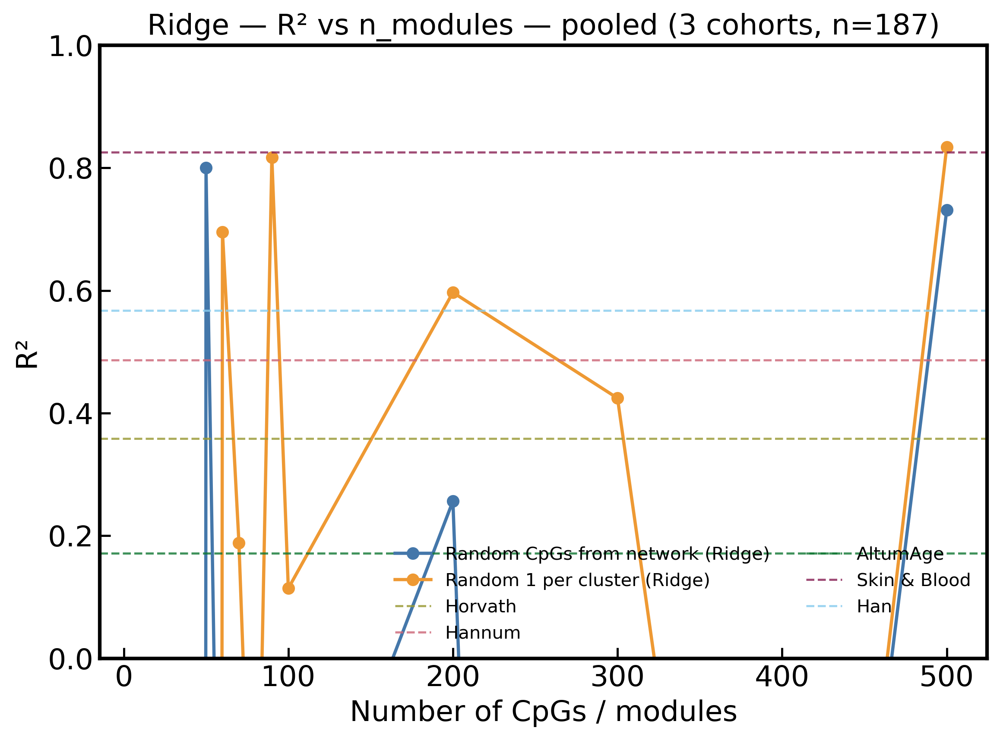

In [22]:
def plot_r2_vs_M_for_methods(ax, df_scope, ref_metrics, methods_to_show, title=""):
    """Generic R² vs M plot — same look as plot_r2_vs_M but driven by an explicit
    list of method names so it works for OLS, Ridge, or any other family."""
    for method, dsub in df_scope.groupby("method"):
        if method not in methods_to_show:
            continue
        dsub = dsub.sort_values("M")
        ax.plot(dsub["M"], dsub["r2"], "o-",
                color=METHOD_COLOR[method], lw=1.8, markersize=6,
                label=METHOD_LABEL[method])
    for cn, r in ref_metrics.items():
        if "r2" not in r: continue
        ax.axhline(r["r2"], ls="--", lw=1.2, alpha=0.8,
                   color=REF_COLOR_MAP.get(cn, "#666"),
                   label=CLOCK_LABELS[cn])
    ax.set_xlabel("Number of CpGs / modules")
    ax.set_ylabel("R²"); ax.set_ylim(0, 1)
    if title: ax.set_title(title)
    ax.tick_params(direction="in", which="both")
    for s in ax.spines.values(): s.set_linewidth(FRAME_LW)


df_pooled_ridge = df_perf_ridge[df_perf_ridge["scope"] == "pooled"]
fig, ax = plt.subplots(figsize=(8, 6))
plot_r2_vs_M_for_methods(
    ax, df_pooled_ridge, ref_pooled,
    methods_to_show=("random_network_ridge", "random_per_cluster_ridge"),
    title=f"Ridge — R² vs n_modules — pooled (3 cohorts, n={sum(len(d['ages']) for d in ext_data)})")
ax.legend(loc="lower right", fontsize=10, frameon=False, ncol=2)
fig.tight_layout()
fig.savefig(OUT_DIR / "ridge_r2_vs_M_pooled.png", dpi=DPI)
fig.savefig(OUT_DIR / "ridge_r2_vs_M_pooled.pdf")
print(f"  -> {OUT_DIR / 'ridge_r2_vs_M_pooled.png'}")
plt.show()


## Ridge — Figure 2: R² vs n_modules, 3 panels (one per cohort)

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/ridge_r2_vs_M_three_panels.png


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

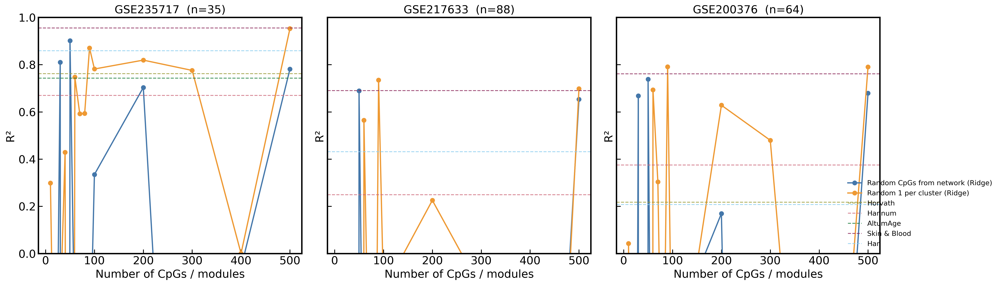

In [23]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)
for ax, d in zip(axes, ext_data):
    df_d = df_perf_ridge[df_perf_ridge["scope"] == d["id"]]
    plot_r2_vs_M_for_methods(
        ax, df_d, ref_per_dataset.get(d["id"], {}),
        methods_to_show=("random_network_ridge", "random_per_cluster_ridge"),
        title=f"{d['id']}  (n={len(d['ages'])})")
axes[-1].legend(loc="lower right", fontsize=10, frameon=False, ncol=1,
                bbox_to_anchor=(1.45, 0.0))
fig.tight_layout()
fig.savefig(OUT_DIR / "ridge_r2_vs_M_three_panels.png", dpi=DPI)
fig.savefig(OUT_DIR / "ridge_r2_vs_M_three_panels.pdf")
print(f"  -> {OUT_DIR / 'ridge_r2_vs_M_three_panels.png'}")
plt.show()


## Ridge — Figures 3 & 4: scatters for best Ridge clocks


── Best Ridge clocks by EXTERNAL pooled R² ──
  Random-from-network (Ridge)     : M=50  (train/test selection had picked M=400)
  Random-one-per-cluster (Ridge)  : M=500  (train/test selection had picked M=500)


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/scatter_ridge_random_network_ext_best.png
  -> outputs/test_network_clock_3cohorts/scatter_ridge_random_network_ext_best.csv


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.


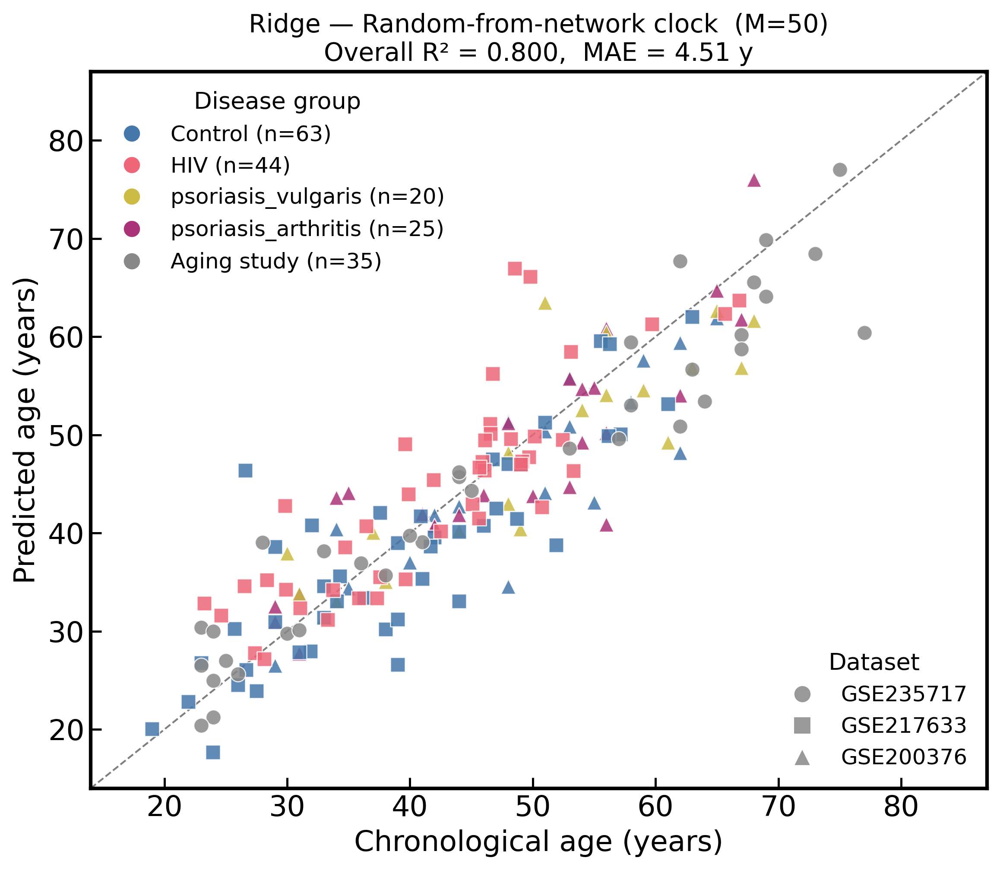

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/scatter_ridge_random_per_cluster_ext_best.png
  -> outputs/test_network_clock_3cohorts/scatter_ridge_random_per_cluster_ext_best.csv


findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Fon

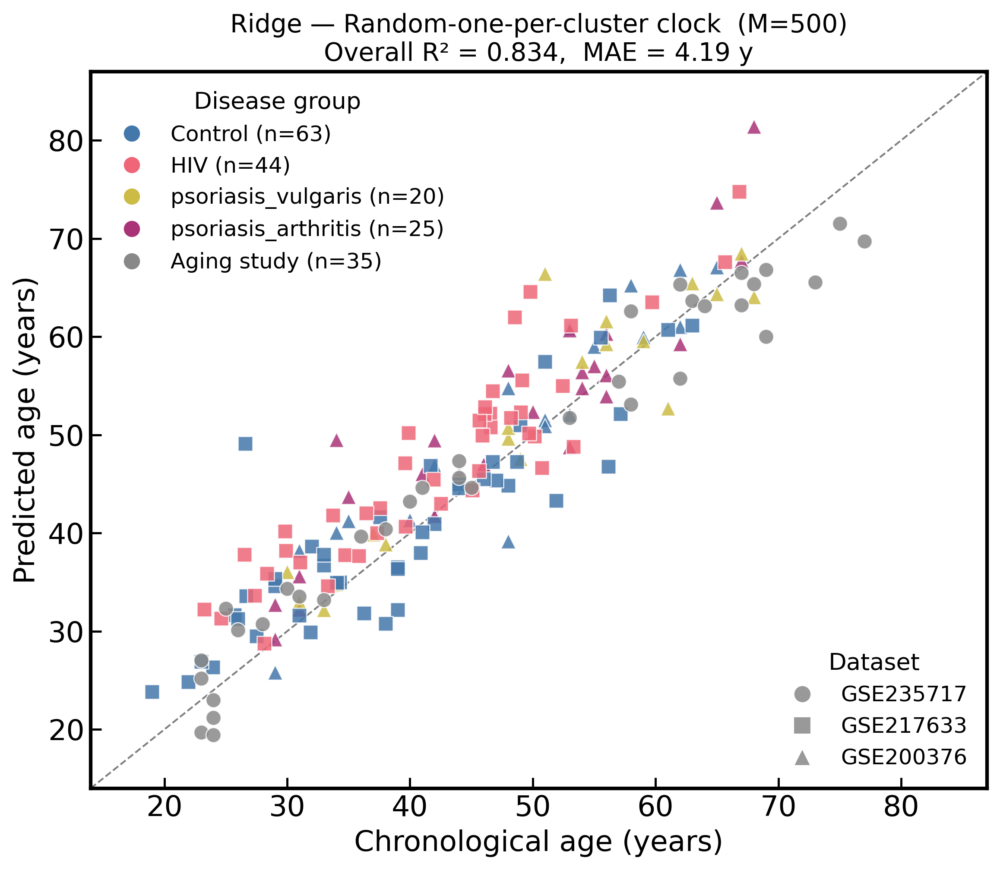

In [24]:
def _best_M_by_external_pooled_ridge(method_name, clocks_dict):
    pooled = df_perf_ridge[(df_perf_ridge["method"] == method_name) &
                            (df_perf_ridge["scope"] == "pooled")]
    pooled = pooled[pooled["M"].isin(clocks_dict.keys())]
    if pooled.empty:
        return max(clocks_dict.items(), key=lambda kv: kv[1]["r2_test"])
    best_row = pooled.loc[pooled["r2"].idxmax()]
    best_M = int(best_row["M"])
    return best_M, clocks_dict[best_M]

ext_best_ridge_net_M,   ext_best_ridge_net_clock   = _best_M_by_external_pooled_ridge(
    "random_network_ridge",     ridge_rand_net)
ext_best_ridge_clust_M, ext_best_ridge_clust_clock = _best_M_by_external_pooled_ridge(
    "random_per_cluster_ridge", ridge_rand_clust)

print(f"\n── Best Ridge clocks by EXTERNAL pooled R² ──")
print(f"  Random-from-network (Ridge)     : M={ext_best_ridge_net_M}  "
      f"(train/test selection had picked M={best_ridge_net_M})")
print(f"  Random-one-per-cluster (Ridge)  : M={ext_best_ridge_clust_M}  "
      f"(train/test selection had picked M={best_ridge_clust_M})")

df_p_ridge_net = make_scatter(
    ext_best_ridge_net_clock,
    f"Ridge — Random-from-network clock  (M={ext_best_ridge_net_M})",
    "scatter_ridge_random_network_ext_best",
)

df_p_ridge_clust = make_scatter(
    ext_best_ridge_clust_clock,
    f"Ridge — Random-one-per-cluster clock  (M={ext_best_ridge_clust_M})",
    "scatter_ridge_random_per_cluster_ext_best",
)


## Ridge — Figure 5: MAE box plots, 6 panels (Ridge best + 5 reference clocks)

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

Wrote outputs/test_network_clock_3cohorts/per_sample_predictions_ridge_ext_best.csv (187 rows)


findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Fon

  -> outputs/test_network_clock_3cohorts/ridge_abs_error_boxplots_6panels.png


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

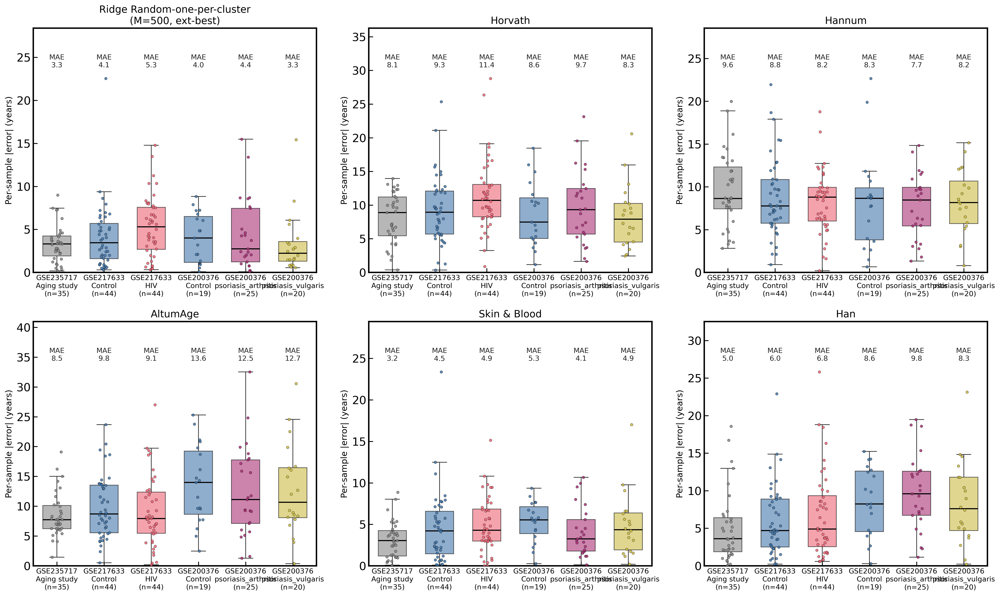

In [25]:
# Predictions of best Ridge random-per-cluster on each cohort
ridge_clust_preds_per_dataset = {}
for d in ext_data:
    pred, _ = apply_network_clock(ext_best_ridge_clust_clock, d["betas"])
    ridge_clust_preds_per_dataset[d["id"]] = pred

rows = []
for d in ext_data:
    for i, (gsm, age, grp) in enumerate(zip(d["gsm_ids"], d["ages"], d["groups"])):
        row = {"dataset": d["id"], "gsm": gsm, "age": age, "group": grp,
               "network": ridge_clust_preds_per_dataset[d["id"]][i]}
        for cn in REFERENCE_CLOCKS:
            row[cn] = ref_predictions[d["id"]][cn][i]
        rows.append(row)
df_pred_ridge = pd.DataFrame(rows)
for clock in ["network"] + REFERENCE_CLOCKS:
    df_pred_ridge[f"abs_err_{clock}"] = (df_pred_ridge[clock] - df_pred_ridge["age"]).abs()
df_pred_ridge.to_csv(OUT_DIR / "per_sample_predictions_ridge_ext_best.csv", index=False)
print(f"Wrote {OUT_DIR / 'per_sample_predictions_ridge_ext_best.csv'} ({len(df_pred_ridge)} rows)")

ordered_pairs = []
for d in EXTERNAL_DATASETS:
    sub = df_pred_ridge[df_pred_ridge["dataset"] == d["id"]]
    if len(sub) == 0: continue
    groups_in_d = sorted(sub["group"].unique(),
                         key=lambda g: (g not in ("Control", "Aging study"), g))
    for g in groups_in_d:
        ordered_pairs.append((d["id"], g))

panels = [("network", f"Ridge Random-one-per-cluster\n(M={ext_best_ridge_clust_M}, ext-best)")]
panels += [(cn, CLOCK_LABELS[cn]) for cn in REFERENCE_CLOCKS]

fig, axes = plt.subplots(2, 3, figsize=(20, 12), sharey=False)
for ax, (clock, title) in zip(axes.flatten(), panels):
    data_for_boxes, labels, colors, mae_per_box = [], [], [], []
    for (dset, grp) in ordered_pairs:
        sub = df_pred_ridge[(df_pred_ridge["dataset"] == dset) &
                             (df_pred_ridge["group"] == grp)]
        vals = sub[f"abs_err_{clock}"].dropna().values
        if len(vals) == 0: continue
        data_for_boxes.append(vals)
        labels.append(f"{dset}\n{grp}\n(n={len(vals)})")
        colors.append(GROUP_COLORS.get(grp, GROUP_COLORS["unknown"]))
        mae_per_box.append(vals.mean())
    if not data_for_boxes:
        ax.set_title(f"{title} (no data)"); ax.axis("off"); continue
    positions = np.arange(len(data_for_boxes))
    bp = ax.boxplot(data_for_boxes, positions=positions, widths=0.6,
                    patch_artist=True, showfliers=False,
                    medianprops={"color": "black", "linewidth": 1.5},
                    whiskerprops={"color": "#333", "linewidth": 1.0},
                    capprops={"color": "#333", "linewidth": 1.0})
    for patch, c in zip(bp["boxes"], colors):
        patch.set_facecolor(c); patch.set_alpha(0.6); patch.set_edgecolor("black")
    rng_local = np.random.RandomState(0)
    for i, vals in enumerate(data_for_boxes):
        x = np.full(len(vals), i) + rng_local.uniform(-0.12, 0.12, len(vals))
        ax.scatter(x, vals, s=14, color=colors[i], edgecolor="black",
                   linewidth=0.3, alpha=0.85, zorder=3)
    y_top = max(max(v.max() for v in data_for_boxes), 5) * 1.05
    for i, mae in enumerate(mae_per_box):
        ax.text(i, y_top, f"MAE\n{mae:.1f}", ha="center", va="bottom",
                fontsize=10, color="#222")
    ax.set_xticks(positions); ax.set_xticklabels(labels, fontsize=10)
    ax.set_title(title, fontsize=14)
    ax.set_ylabel("Per-sample |error| (years)", fontsize=12)
    ax.tick_params(direction="in", which="both")
    for s in ax.spines.values(): s.set_linewidth(FRAME_LW)
    ax.set_ylim(0, y_top * 1.2)
fig.tight_layout()
fig.savefig(OUT_DIR / "ridge_abs_error_boxplots_6panels.png", dpi=DPI)
fig.savefig(OUT_DIR / "ridge_abs_error_boxplots_6panels.pdf")
print(f"  -> {OUT_DIR / 'ridge_abs_error_boxplots_6panels.png'}")
plt.show()


## Ridge — Figure 6: pooled MAE box plot, one box per clock

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/ridge_abs_error_boxplot_per_clock.png


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

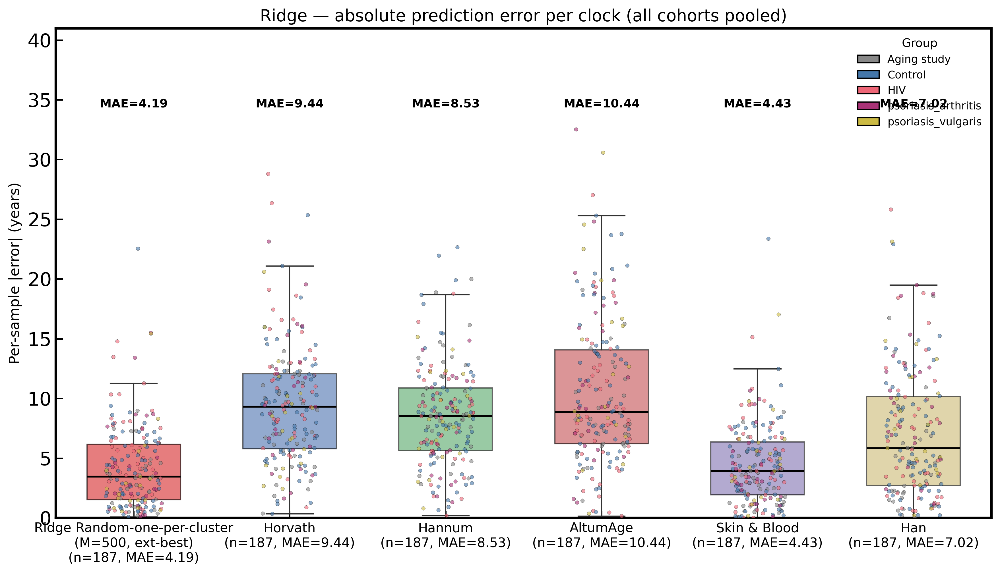

In [26]:
clocks_box = [("network", f"Ridge Random-one-per-cluster\n(M={ext_best_ridge_clust_M}, ext-best)")]
clocks_box += [(cn, CLOCK_LABELS[cn]) for cn in REFERENCE_CLOCKS]

data_for_boxes, labels, mae_per_box = [], [], []
for clock, title in clocks_box:
    vals = df_pred_ridge[f"abs_err_{clock}"].dropna().values
    data_for_boxes.append(vals)
    labels.append(f"{title}\n(n={len(vals)}, MAE={vals.mean():.2f})")
    mae_per_box.append(vals.mean())

clock_colors = ["#d62728"] + ["#4c72b0", "#55a868", "#c44e52",
                              "#8172b2", "#ccb974"][:len(REFERENCE_CLOCKS)]

fig, ax = plt.subplots(1, 1, figsize=(12, 7))
positions = np.arange(len(data_for_boxes))
bp = ax.boxplot(data_for_boxes, positions=positions, widths=0.6,
                patch_artist=True, showfliers=False,
                medianprops={"color": "black", "linewidth": 1.5},
                whiskerprops={"color": "#333", "linewidth": 1.0},
                capprops={"color": "#333", "linewidth": 1.0})
for patch, c in zip(bp["boxes"], clock_colors):
    patch.set_facecolor(c); patch.set_alpha(0.6); patch.set_edgecolor("black")

rng_local = np.random.RandomState(0)
for i, (clock, _) in enumerate(clocks_box):
    sub = df_pred_ridge[[f"abs_err_{clock}", "group"]].dropna()
    vals = sub[f"abs_err_{clock}"].values
    point_colors = [GROUP_COLORS.get(g, GROUP_COLORS["unknown"]) for g in sub["group"]]
    x = np.full(len(vals), i) + rng_local.uniform(-0.18, 0.18, len(vals))
    ax.scatter(x, vals, s=10, c=point_colors, edgecolor="black",
               linewidth=0.2, alpha=0.6, zorder=3)

y_top = max(v.max() for v in data_for_boxes) * 1.05
for i, m in enumerate(mae_per_box):
    ax.text(i, y_top, f"MAE={m:.2f}", ha="center", va="bottom",
            fontsize=10, fontweight="bold")
ax.set_xticks(positions); ax.set_xticklabels(labels, fontsize=11)
ax.set_title("Ridge — absolute prediction error per clock (all cohorts pooled)",
             fontsize=14)
ax.set_ylabel("Per-sample |error| (years)", fontsize=12)
ax.set_ylim(0, y_top * 1.2)
ax.tick_params(direction="in", which="both")
for s in ax.spines.values(): s.set_linewidth(FRAME_LW)

from matplotlib.patches import Patch
groups_present = sorted(df_pred_ridge["group"].unique(),
                        key=lambda g: (g not in ("Control", "Aging study"), g))
handles = [Patch(facecolor=GROUP_COLORS.get(g, GROUP_COLORS["unknown"]),
                 edgecolor="black", label=g) for g in groups_present]
ax.legend(handles=handles, title="Group", loc="upper right",
          frameon=False, fontsize=9, title_fontsize=10)

fig.tight_layout()
fig.savefig(OUT_DIR / "ridge_abs_error_boxplot_per_clock.png", dpi=DPI)
fig.savefig(OUT_DIR / "ridge_abs_error_boxplot_per_clock.pdf")
print(f"  -> {OUT_DIR / 'ridge_abs_error_boxplot_per_clock.png'}")
plt.show()


---
# PCA clock — same plots, sweeping over K (number of PCs)

Single "method" — PCA on the cluster-level methylation matrix, ridge regression on the top-K PC scores. The M axis from the OLS/Ridge plots becomes K = number of PCs. `apply_pca_clock` is used instead of `apply_network_clock` because the pipeline is cluster → standardise → PCA project → regress.

In [27]:
# Per-K performance of the PCA clock on external cohorts
pca_perf_rows = []
for K, subclock in pca_subclocks.items():
    ages_pool, pred_pool = [], []
    for d in ext_data:
        pred, n_miss = apply_pca_clock(subclock, d["betas"])
        ages_pool.append(d["ages"]); pred_pool.append(pred)
        r2_d  = r2_score(d["ages"], pred) if len(d["ages"]) >= 3 else np.nan
        mae_d = mean_absolute_error(d["ages"], pred)
        pca_perf_rows.append({
            "method": "pca", "M": K, "scope": d["id"],
            "n_samples": len(d["ages"]), "n_cpgs_missing": n_miss,
            "r2": r2_d, "mae": mae_d,
        })
    ages_all = np.concatenate(ages_pool)
    pred_all = np.concatenate(pred_pool)
    pca_perf_rows.append({
        "method": "pca", "M": K, "scope": "pooled",
        "n_samples": len(ages_all), "n_cpgs_missing": None,
        "r2":  r2_score(ages_all, pred_all),
        "mae": mean_absolute_error(ages_all, pred_all),
    })

df_perf_pca = pd.DataFrame(pca_perf_rows)
df_perf_pca.to_csv(OUT_DIR / "pca_clock_perf_by_K.csv", index=False)
print(df_perf_pca.head(20).to_string(index=False))


# ── Per-K performance of the NETWORK-baseline PCA clock ─────────────
pca_net_perf_rows = []
for K, subclock in pca_net_subclocks.items():
    ages_pool, pred_pool = [], []
    for d in ext_data:
        pred, n_miss = apply_pca_network_clock(subclock, d["betas"])
        ages_pool.append(d["ages"]); pred_pool.append(pred)
        r2_d  = r2_score(d["ages"], pred) if len(d["ages"]) >= 3 else np.nan
        mae_d = mean_absolute_error(d["ages"], pred)
        pca_net_perf_rows.append({
            "method": "pca_network", "M": K, "scope": d["id"],
            "n_samples": len(d["ages"]), "n_cpgs_missing": n_miss,
            "r2": r2_d, "mae": mae_d,
        })
    ages_all = np.concatenate(ages_pool)
    pred_all = np.concatenate(pred_pool)
    pca_net_perf_rows.append({
        "method": "pca_network", "M": K, "scope": "pooled",
        "n_samples": len(ages_all), "n_cpgs_missing": None,
        "r2":  r2_score(ages_all, pred_all),
        "mae": mean_absolute_error(ages_all, pred_all),
    })

df_perf_pca_net = pd.DataFrame(pca_net_perf_rows)
df_perf_pca_net.to_csv(OUT_DIR / "pca_network_clock_perf_by_K.csv", index=False)
print(df_perf_pca_net.head(20).to_string(index=False))


# ── Per-K performance of the WHOLE-ARRAY PCA clock ──────────────────
pca_arr_perf_rows = []
for K, subclock in pca_arr_subclocks.items():
    ages_pool, pred_pool = [], []
    for d in ext_data:
        pred, n_miss = apply_pca_network_clock(subclock, d["betas"])   # generic cpg_order predictor
        ages_pool.append(d["ages"]); pred_pool.append(pred)
        r2_d  = r2_score(d["ages"], pred) if len(d["ages"]) >= 3 else np.nan
        mae_d = mean_absolute_error(d["ages"], pred)
        pca_arr_perf_rows.append({
            "method": "pca_array", "M": K, "scope": d["id"],
            "n_samples": len(d["ages"]), "n_cpgs_missing": n_miss,
            "r2": r2_d, "mae": mae_d,
        })
    ages_all = np.concatenate(ages_pool)
    pred_all = np.concatenate(pred_pool)
    pca_arr_perf_rows.append({
        "method": "pca_array", "M": K, "scope": "pooled",
        "n_samples": len(ages_all), "n_cpgs_missing": None,
        "r2":  r2_score(ages_all, pred_all),
        "mae": mean_absolute_error(ages_all, pred_all),
    })

df_perf_pca_arr = pd.DataFrame(pca_arr_perf_rows)
df_perf_pca_arr.to_csv(OUT_DIR / "pca_array_clock_perf_by_K.csv", index=False)
print(df_perf_pca_arr.head(20).to_string(index=False))

# Portability diagnostic: how much of the whole-array feature set survives in each cohort
n_total_arr = len(pca_array_clock["cpg_order"])
print(f"\n  Whole-array clock CpG coverage per external cohort "
      f"(clock uses {n_total_arr:,} CpGs):")
for d in ext_data:
    n_present = int(sum(c in d["betas"].columns for c in pca_array_clock["cpg_order"]))
    print(f"    {d['id']}: {n_present:,}/{n_total_arr:,} present "
          f"({100*n_present/n_total_arr:.1f}%) — {n_total_arr - n_present:,} filled with training mean")


method  M     scope  n_samples  n_cpgs_missing       r2      mae
   pca 10 GSE235717         35           559.0 0.928352 4.166045
   pca 10 GSE217633         88           567.0 0.635240 5.221853
   pca 10 GSE200376         64           566.0 0.816412 3.851224
   pca 10    pooled        187             NaN 0.812665 4.555149
   pca 20 GSE235717         35           559.0 0.940537 3.857667
   pca 20 GSE217633         88           567.0 0.705253 4.688226
   pca 20 GSE200376         64           566.0 0.842379 3.498242
   pca 20    pooled        187             NaN 0.845675 4.125506
   pca 30 GSE235717         35           559.0 0.935836 3.645321
   pca 30 GSE217633         88           567.0 0.819642 3.530266
   pca 30 GSE200376         64           566.0 0.879793 3.011717
   pca 30    pooled        187             NaN 0.889684 3.374329
   pca 40 GSE235717         35           559.0 0.946244 3.394486
   pca 40 GSE217633         88           567.0 0.814591 3.605238
   pca 40 GSE200376      

## PCA — Figure 1: R² vs K (pooled across 3 cohorts)

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/pca_r2_vs_K_pooled.png


findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.


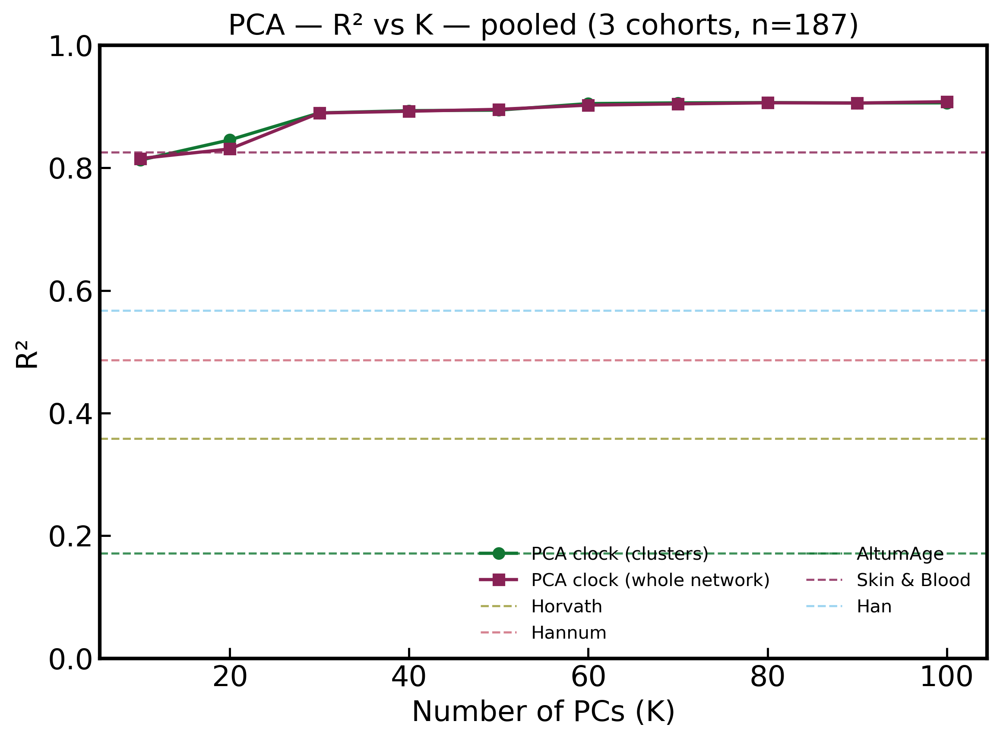

In [28]:
def plot_r2_vs_K_pca(ax, df_cluster, df_network=None, df_array=None,
                     ref_metrics=None, title=""):
    """R² vs K — overlay cluster / whole-network / whole-array PCA curves."""
    dc = df_cluster[df_cluster["method"] == "pca"].sort_values("M")
    ax.plot(dc["M"], dc["r2"], "o-", color=METHOD_COLOR["pca"], lw=1.8, markersize=6,
            label=METHOD_LABEL["pca"])
    if df_network is not None and len(df_network) > 0:
        dn = df_network[df_network["method"] == "pca_network"].sort_values("M")
        ax.plot(dn["M"], dn["r2"], "s-", color=METHOD_COLOR["pca_network"], lw=1.8,
                markersize=6, label=METHOD_LABEL["pca_network"])
    if df_array is not None and len(df_array) > 0:
        da = df_array[df_array["method"] == "pca_array"].sort_values("M")
        ax.plot(da["M"], da["r2"], "^-", color=METHOD_COLOR["pca_array"], lw=1.8,
                markersize=6, label=METHOD_LABEL["pca_array"])
    if ref_metrics is not None:
        for cn, r in ref_metrics.items():
            if "r2" not in r: continue
            ax.axhline(r["r2"], ls="--", lw=1.2, alpha=0.8,
                       color=REF_COLOR_MAP.get(cn, "#666"), label=CLOCK_LABELS[cn])
    ax.set_xlabel("Number of PCs (K)")
    ax.set_ylabel("R²"); ax.set_ylim(0, 1)
    if title: ax.set_title(title)
    ax.tick_params(direction="in", which="both")
    for s in ax.spines.values(): s.set_linewidth(FRAME_LW)


df_pooled_pca     = df_perf_pca[df_perf_pca["scope"] == "pooled"]
df_pooled_pca_net = df_perf_pca_net[df_perf_pca_net["scope"] == "pooled"]
df_pooled_pca_arr = df_perf_pca_arr[df_perf_pca_arr["scope"] == "pooled"]
fig, ax = plt.subplots(figsize=(8, 6))
plot_r2_vs_K_pca(
    ax, df_pooled_pca, df_pooled_pca_net, df_pooled_pca_arr, ref_pooled,
    title=f"PCA — R² vs K — pooled (3 cohorts, n={sum(len(d['ages']) for d in ext_data)})")
ax.legend(loc="lower right", fontsize=9, frameon=False, ncol=2)
fig.tight_layout()
fig.savefig(OUT_DIR / "pca_r2_vs_K_pooled.png", dpi=DPI)
fig.savefig(OUT_DIR / "pca_r2_vs_K_pooled.pdf")
print(f"  -> {OUT_DIR / 'pca_r2_vs_K_pooled.png'}")
plt.show()


## PCA — Figure 2: R² vs K, 3 panels (one per cohort)

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/pca_r2_vs_K_three_panels.png


findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Fon

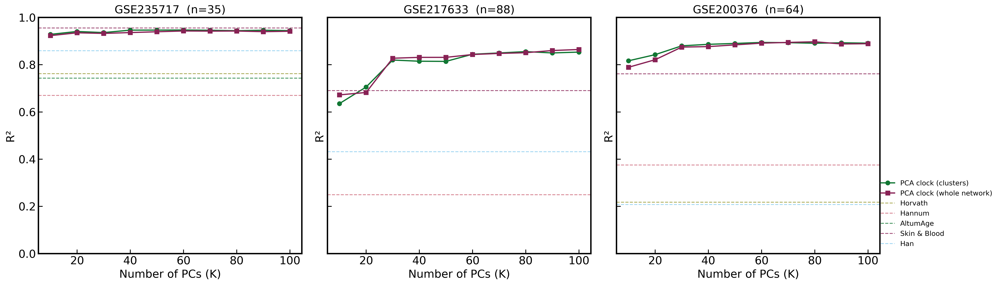

In [29]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)
for ax, d in zip(axes, ext_data):
    df_c = df_perf_pca[df_perf_pca["scope"] == d["id"]]
    df_n = df_perf_pca_net[df_perf_pca_net["scope"] == d["id"]]
    df_a = df_perf_pca_arr[df_perf_pca_arr["scope"] == d["id"]]
    plot_r2_vs_K_pca(ax, df_c, df_n, df_a, ref_per_dataset.get(d["id"], {}),
                      title=f"{d['id']}  (n={len(d['ages'])})")
axes[-1].legend(loc="lower right", fontsize=9, frameon=False, ncol=1,
                bbox_to_anchor=(1.55, 0.0))
fig.tight_layout()
fig.savefig(OUT_DIR / "pca_r2_vs_K_three_panels.png", dpi=DPI)
fig.savefig(OUT_DIR / "pca_r2_vs_K_three_panels.pdf")
print(f"  -> {OUT_DIR / 'pca_r2_vs_K_three_panels.png'}")
plt.show()


## PCA — Figure 3: scatter for best K (by external pooled R²)


── Best PCA K by EXTERNAL pooled R² ──
  PCA: K=80  (train/test selection had picked K=60)


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/scatter_pca_ext_best.png
  -> outputs/test_network_clock_3cohorts/scatter_pca_ext_best.csv


findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Fon

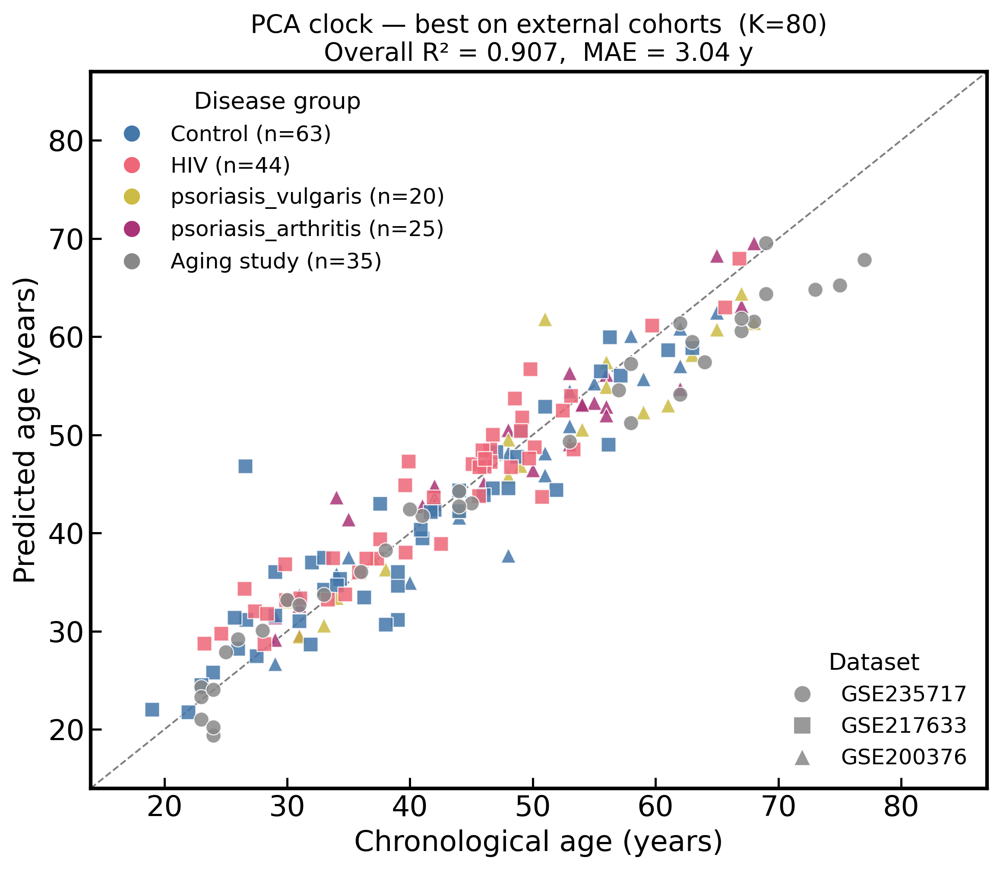

In [30]:
# Best K by EXTERNAL pooled R² (may differ from train/test best_K)
pooled_pca = df_perf_pca[df_perf_pca["scope"] == "pooled"]
ext_best_K = int(pooled_pca.loc[pooled_pca["r2"].idxmax(), "M"])
ext_best_pca_subclock = pca_subclocks[ext_best_K]

print(f"\n── Best PCA K by EXTERNAL pooled R² ──")
print(f"  PCA: K={ext_best_K}  (train/test selection had picked K={pca_clock['best_K']})")

# Reuse make_scatter — pass apply_pca_clock as apply_fn
df_p_pca = make_scatter(
    ext_best_pca_subclock,
    f"PCA clock — best on external cohorts  (K={ext_best_K})",
    "scatter_pca_ext_best",
    apply_fn=apply_pca_clock,
)


## PCA — Figure 3b: scatter for the network-baseline PCA, best K by external pooled R²

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:


── Best network-PCA K by EXTERNAL pooled R² ──
  PCA-network: K=100  (train/test selection had picked K=80)


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/scatter_pca_network_ext_best.png
  -> outputs/test_network_clock_3cohorts/scatter_pca_network_ext_best.csv


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

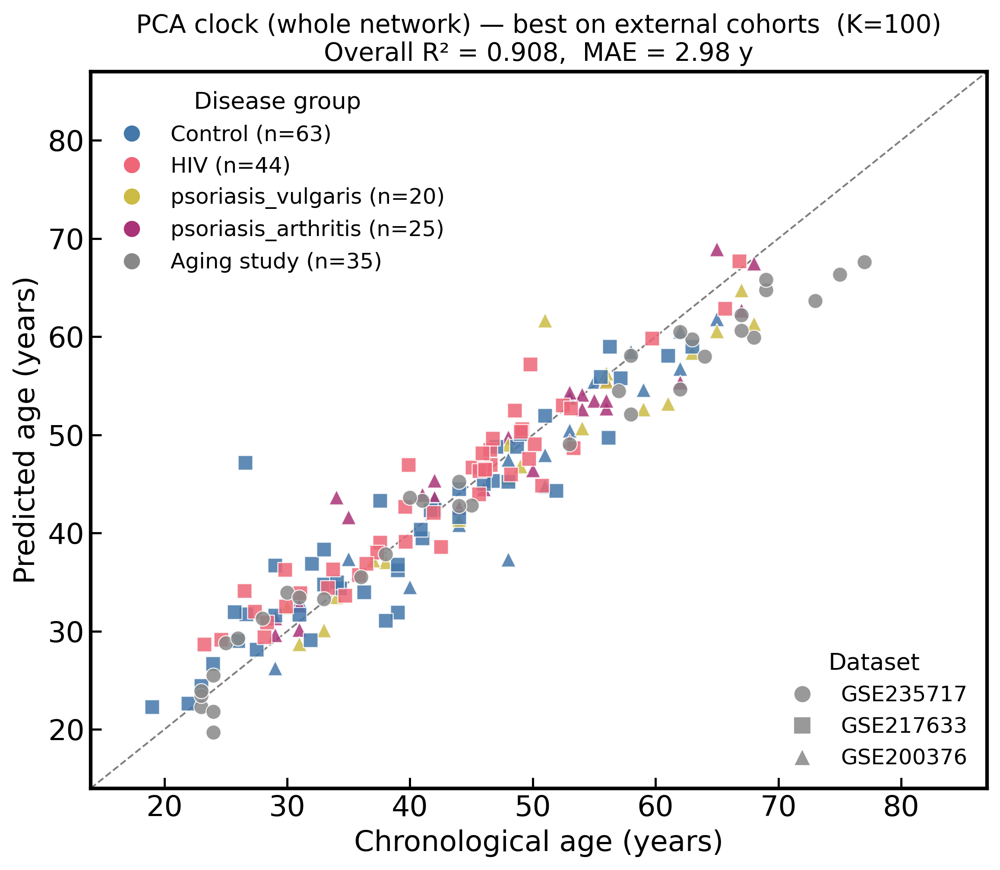

In [31]:
pooled_pca_net = df_perf_pca_net[df_perf_pca_net["scope"] == "pooled"]
ext_best_K_net = int(pooled_pca_net.loc[pooled_pca_net["r2"].idxmax(), "M"])
ext_best_pca_net_subclock = pca_net_subclocks[ext_best_K_net]

print(f"\n── Best network-PCA K by EXTERNAL pooled R² ──")
print(f"  PCA-network: K={ext_best_K_net}  "
      f"(train/test selection had picked K={pca_network_clock['best_K']})")

df_p_pca_net = make_scatter(
    ext_best_pca_net_subclock,
    f"PCA clock (whole network) — best on external cohorts  (K={ext_best_K_net})",
    "scatter_pca_network_ext_best",
    apply_fn=apply_pca_network_clock,
)


## PCA — Figure 3c: scatter for the whole-array PCA, best K by external pooled R²

In [ ]:
pooled_pca_arr = df_perf_pca_arr[df_perf_pca_arr["scope"] == "pooled"]
ext_best_K_arr = int(pooled_pca_arr.loc[pooled_pca_arr["r2"].idxmax(), "M"])
ext_best_pca_arr_subclock = pca_arr_subclocks[ext_best_K_arr]

print(f"\n── Best whole-array PCA K by EXTERNAL pooled R² ──")
print(f"  PCA-array: K={ext_best_K_arr}  "
      f"(train/test selection had picked K={pca_array_clock['best_K']})")

df_p_pca_arr = make_scatter(
    ext_best_pca_arr_subclock,
    f"PCA clock (whole array) — best on external cohorts  (K={ext_best_K_arr})",
    "scatter_pca_array_ext_best",
    apply_fn=apply_pca_network_clock,
)


## PCA — Figure 5: MAE box plots, 6 panels (PCA best + 5 reference clocks)

Wrote outputs/test_network_clock_3cohorts/per_sample_predictions_pca_ext_best.csv (187 rows)


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/pca_abs_error_boxplots_7panels.png


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

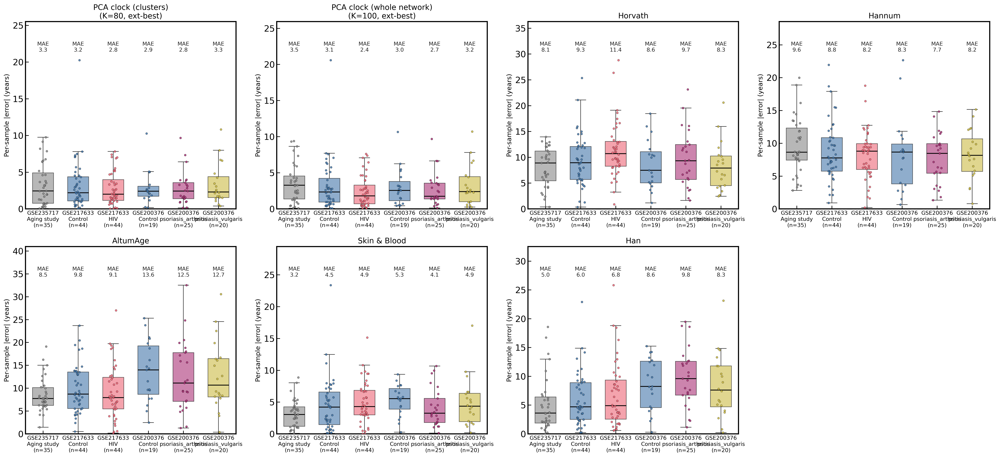

In [32]:
# Predictions of best cluster / whole-network / whole-array PCA sub-clocks per cohort
pca_preds_per_dataset     = {}
pca_net_preds_per_dataset = {}
pca_arr_preds_per_dataset = {}
for d in ext_data:
    pred_c, _ = apply_pca_clock(ext_best_pca_subclock, d["betas"])
    pred_n, _ = apply_pca_network_clock(ext_best_pca_net_subclock, d["betas"])
    pred_a, _ = apply_pca_network_clock(ext_best_pca_arr_subclock, d["betas"])
    pca_preds_per_dataset[d["id"]]     = pred_c
    pca_net_preds_per_dataset[d["id"]] = pred_n
    pca_arr_preds_per_dataset[d["id"]] = pred_a

rows = []
for d in ext_data:
    for i, (gsm, age, grp) in enumerate(zip(d["gsm_ids"], d["ages"], d["groups"])):
        row = {"dataset": d["id"], "gsm": gsm, "age": age, "group": grp,
               "network":  pca_preds_per_dataset[d["id"]][i],       # cluster PCA
               "pca_net":  pca_net_preds_per_dataset[d["id"]][i],   # whole-network PCA
               "pca_arr":  pca_arr_preds_per_dataset[d["id"]][i]}   # whole-array PCA
        for cn in REFERENCE_CLOCKS:
            row[cn] = ref_predictions[d["id"]][cn][i]
        rows.append(row)
df_pred_pca = pd.DataFrame(rows)
for clock in ["network", "pca_net", "pca_arr"] + REFERENCE_CLOCKS:
    df_pred_pca[f"abs_err_{clock}"] = (df_pred_pca[clock] - df_pred_pca["age"]).abs()
df_pred_pca.to_csv(OUT_DIR / "per_sample_predictions_pca_ext_best.csv", index=False)
print(f"Wrote {OUT_DIR / 'per_sample_predictions_pca_ext_best.csv'} ({len(df_pred_pca)} rows)")

ordered_pairs = []
for d in EXTERNAL_DATASETS:
    sub = df_pred_pca[df_pred_pca["dataset"] == d["id"]]
    if len(sub) == 0: continue
    groups_in_d = sorted(sub["group"].unique(),
                         key=lambda g: (g not in ("Control", "Aging study"), g))
    for g in groups_in_d:
        ordered_pairs.append((d["id"], g))

# 8 panels = cluster + whole-network + whole-array PCA + 5 reference clocks → 2×4 grid
panels = [
    ("network", f"PCA clock (clusters)\n(K={ext_best_K}, ext-best)"),
    ("pca_net", f"PCA clock (whole network)\n(K={ext_best_K_net}, ext-best)"),
    ("pca_arr", f"PCA clock (whole array)\n(K={ext_best_K_arr}, ext-best)"),
]
panels += [(cn, CLOCK_LABELS[cn]) for cn in REFERENCE_CLOCKS]

fig, axes = plt.subplots(2, 4, figsize=(26, 12), sharey=False)
flat_axes = axes.flatten()
for ax, (clock, title) in zip(flat_axes, panels):
    data_for_boxes, labels, colors, mae_per_box = [], [], [], []
    for (dset, grp) in ordered_pairs:
        sub = df_pred_pca[(df_pred_pca["dataset"] == dset) &
                          (df_pred_pca["group"] == grp)]
        vals = sub[f"abs_err_{clock}"].dropna().values
        if len(vals) == 0: continue
        data_for_boxes.append(vals)
        labels.append(f"{dset}\n{grp}\n(n={len(vals)})")
        colors.append(GROUP_COLORS.get(grp, GROUP_COLORS["unknown"]))
        mae_per_box.append(vals.mean())
    if not data_for_boxes:
        ax.set_title(f"{title} (no data)"); ax.axis("off"); continue
    positions = np.arange(len(data_for_boxes))
    bp = ax.boxplot(data_for_boxes, positions=positions, widths=0.6,
                    patch_artist=True, showfliers=False,
                    medianprops={"color": "black", "linewidth": 1.5},
                    whiskerprops={"color": "#333", "linewidth": 1.0},
                    capprops={"color": "#333", "linewidth": 1.0})
    for patch, c in zip(bp["boxes"], colors):
        patch.set_facecolor(c); patch.set_alpha(0.6); patch.set_edgecolor("black")
    rng_local = np.random.RandomState(0)
    for i, vals in enumerate(data_for_boxes):
        x = np.full(len(vals), i) + rng_local.uniform(-0.12, 0.12, len(vals))
        ax.scatter(x, vals, s=14, color=colors[i], edgecolor="black",
                   linewidth=0.3, alpha=0.85, zorder=3)
    y_top = max(max(v.max() for v in data_for_boxes), 5) * 1.05
    for i, mae in enumerate(mae_per_box):
        ax.text(i, y_top, f"MAE\n{mae:.1f}", ha="center", va="bottom",
                fontsize=10, color="#222")
    ax.set_xticks(positions); ax.set_xticklabels(labels, fontsize=10)
    ax.set_title(title, fontsize=14)
    ax.set_ylabel("Per-sample |error| (years)", fontsize=12)
    ax.tick_params(direction="in", which="both")
    for s in ax.spines.values(): s.set_linewidth(FRAME_LW)
    ax.set_ylim(0, y_top * 1.2)
for ax in flat_axes[len(panels):]:
    ax.axis("off")
fig.tight_layout()
fig.savefig(OUT_DIR / "pca_abs_error_boxplots_8panels.png", dpi=DPI)
fig.savefig(OUT_DIR / "pca_abs_error_boxplots_8panels.pdf")
print(f"  -> {OUT_DIR / 'pca_abs_error_boxplots_8panels.png'}")
plt.show()


## PCA — Figure 6: pooled MAE box plot, one box per clock

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont:

  -> outputs/test_network_clock_3cohorts/pca_abs_error_boxplot_per_clock.png


findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Arial' not found.
findfont: Fon

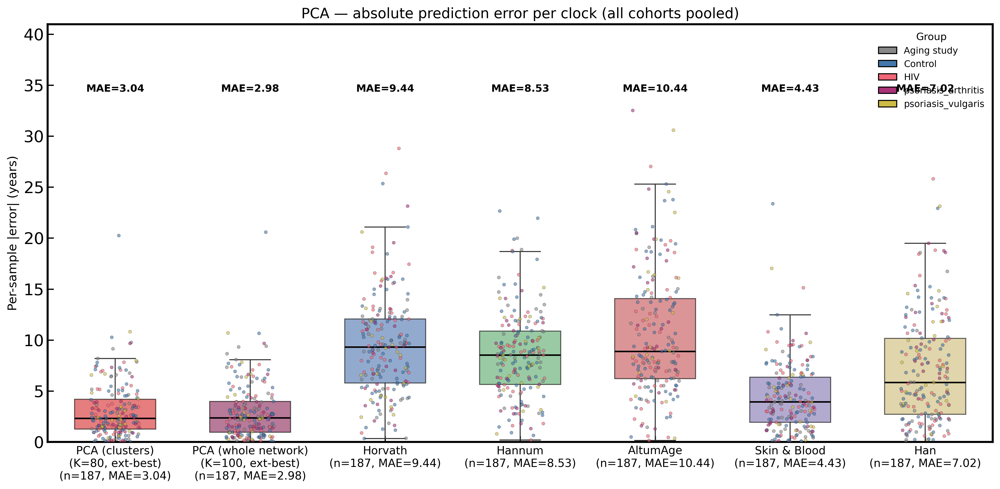

In [33]:
clocks_box = [
    ("network", f"PCA (clusters)\n(K={ext_best_K}, ext-best)"),
    ("pca_net", f"PCA (whole network)\n(K={ext_best_K_net}, ext-best)"),
    ("pca_arr", f"PCA (whole array)\n(K={ext_best_K_arr}, ext-best)"),
]
clocks_box += [(cn, CLOCK_LABELS[cn]) for cn in REFERENCE_CLOCKS]

data_for_boxes, labels, mae_per_box = [], [], []
for clock, title in clocks_box:
    vals = df_pred_pca[f"abs_err_{clock}"].dropna().values
    data_for_boxes.append(vals)
    labels.append(f"{title}\n(n={len(vals)}, MAE={vals.mean():.2f})")
    mae_per_box.append(vals.mean())

# Distinct colours: two PCA boxes first (cluster red, network purple), then 5 references
clock_colors = ["#d62728", "#882255", "#EE7733"] + ["#4c72b0", "#55a868", "#c44e52",
                                                     "#8172b2", "#ccb974"][:len(REFERENCE_CLOCKS)]

fig, ax = plt.subplots(1, 1, figsize=(14, 7))
positions = np.arange(len(data_for_boxes))
bp = ax.boxplot(data_for_boxes, positions=positions, widths=0.6,
                patch_artist=True, showfliers=False,
                medianprops={"color": "black", "linewidth": 1.5},
                whiskerprops={"color": "#333", "linewidth": 1.0},
                capprops={"color": "#333", "linewidth": 1.0})
for patch, c in zip(bp["boxes"], clock_colors):
    patch.set_facecolor(c); patch.set_alpha(0.6); patch.set_edgecolor("black")

rng_local = np.random.RandomState(0)
for i, (clock, _) in enumerate(clocks_box):
    sub = df_pred_pca[[f"abs_err_{clock}", "group"]].dropna()
    vals = sub[f"abs_err_{clock}"].values
    point_colors = [GROUP_COLORS.get(g, GROUP_COLORS["unknown"]) for g in sub["group"]]
    x = np.full(len(vals), i) + rng_local.uniform(-0.18, 0.18, len(vals))
    ax.scatter(x, vals, s=10, c=point_colors, edgecolor="black",
               linewidth=0.2, alpha=0.6, zorder=3)

y_top = max(v.max() for v in data_for_boxes) * 1.05
for i, m in enumerate(mae_per_box):
    ax.text(i, y_top, f"MAE={m:.2f}", ha="center", va="bottom",
            fontsize=10, fontweight="bold")
ax.set_xticks(positions); ax.set_xticklabels(labels, fontsize=11)
ax.set_title("PCA — absolute prediction error per clock (all cohorts pooled)",
             fontsize=14)
ax.set_ylabel("Per-sample |error| (years)", fontsize=12)
ax.set_ylim(0, y_top * 1.2)
ax.tick_params(direction="in", which="both")
for s in ax.spines.values(): s.set_linewidth(FRAME_LW)

from matplotlib.patches import Patch
groups_present = sorted(df_pred_pca["group"].unique(),
                        key=lambda g: (g not in ("Control", "Aging study"), g))
handles = [Patch(facecolor=GROUP_COLORS.get(g, GROUP_COLORS["unknown"]),
                 edgecolor="black", label=g) for g in groups_present]
ax.legend(handles=handles, title="Group", loc="upper right",
          frameon=False, fontsize=9, title_fontsize=10)

fig.tight_layout()
fig.savefig(OUT_DIR / "pca_abs_error_boxplot_per_clock.png", dpi=DPI)
fig.savefig(OUT_DIR / "pca_abs_error_boxplot_per_clock.pdf")
print(f"  -> {OUT_DIR / 'pca_abs_error_boxplot_per_clock.png'}")
plt.show()
